# **Wind Turbine Power Prediction using CNN, WT, Attention and BiLSTM**

# **Importing Libraries**

In [1]:
# Importing necessary libraries
import os
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import scipy.stats as stats
import warnings
import math
from colorama import Fore

# Ignore all warnings to keep the output clean
warnings.filterwarnings("ignore")

# Keras and TensorFlow imports for deep learning models
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import (
    Dense, LSTM, Dropout, LayerNormalization, Input, Bidirectional, MultiHeadAttention, Layer
)


from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model

# Scikit-learn imports for metrics and preprocessing
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler

# For displaying images in Jupyter Notebook
from IPython.display import Image

# **Setting the working directory**

In [2]:
# Print all file paths in the dataset directory for verification
data_dir = r'C:\Users\zhoul\Desktop\HomeWork\Project\202118010418_Project_Code\data'
for dirname, _, filenames in os.walk(data_dir):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:\Users\zhoul\Desktop\HomeWork\Project\202118010418_Project_Code\data\Location1.csv
C:\Users\zhoul\Desktop\HomeWork\Project\202118010418_Project_Code\data\Location2.csv
C:\Users\zhoul\Desktop\HomeWork\Project\202118010418_Project_Code\data\readme.txt


In [3]:
# Reading the first dataset (Location1)
df = pd.read_csv(os.path.join(data_dir, 'Location1.csv'))

# Copying the dataframe for further processing
df1 = df.copy()

# Reading the second dataset (Location2)
df2 = pd.read_csv(os.path.join(data_dir, 'Location2.csv'))

# **Exploratory Data Analysis (EDA)**

In [4]:
# Displaying the first few rows of the dataset
df1.head()

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power
0,2017-01-02 00:00:00,28.5,85,24.5,1.44,1.26,146,162,1.4,0.1635
1,2017-01-02 01:00:00,28.4,86,24.7,2.06,3.99,151,158,4.4,0.1424
2,2017-01-02 02:00:00,26.8,91,24.5,1.30,2.78,148,150,3.2,0.1214
3,2017-01-02 03:00:00,27.4,88,24.3,1.30,2.69,58,105,1.6,0.1003
4,2017-01-02 04:00:00,27.3,88,24.1,2.47,4.43,58,84,4.0,0.0793


In [5]:
# Displaying the last few rows of the dataset
df1.tail()

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power
43795,2021-12-31 19:00:00,34.1,94,32.5,1.00,1.91,53,137,2.5,0.1796
43796,2021-12-31 20:00:00,34.8,94,33.4,2.52,4.30,56,72,4.8,0.2066
43797,2021-12-31 21:00:00,34.1,95,33.0,1.10,1.84,360,45,4.3,0.2336
43798,2021-12-31 22:00:00,34.4,96,33.5,2.40,4.62,45,51,4.2,0.2606
43799,2021-12-31 23:00:00,35.0,97,34.2,2.26,5.04,45,51,4.3,0.2877


In [6]:
# Displaying the shape of the dataset
df1.describe()

,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power
count,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000
mean,47.862911,72.288744,38.569308,3.591147,6.284431,203.637329,203.343676,7.771795,0.405385
std,19.453691,16.852287,18.772110,1.649318,2.685216,96.371262,97.959852,3.569147,0.288322
min,-14.400000,18.000000,-17.100000,0.000000,0.100000,1.000000,0.000000,0.500000,0.000000
25%,32.100000,60.000000,24.300000,2.410000,4.380000,132.000000,130.000000,5.000000,0.148900
50%,47.300000,74.000000,38.100000,3.300000,6.080000,225.000000,226.000000,7.200000,0.347650
75%,64.500000,86.000000,54.700000,4.590000,7.990000,277.000000,278.000000,10.000000,0.659600
max,94.100000,100.000000,76.300000,13.450000,20.650000,360.000000,360.000000,29.200000,0.991300


In [7]:
# Displaying the data information of the columns
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43800 entries, 0 to 43799
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 43800 non-null  object 
 1   temperature_2m       43800 non-null  float64
 2   relativehumidity_2m  43800 non-null  int64  
 3   dewpoint_2m          43800 non-null  float64
 4   windspeed_10m        43800 non-null  float64
 5   windspeed_100m       43800 non-null  float64
 6   winddirection_10m    43800 non-null  int64  
 7   winddirection_100m   43800 non-null  int64  
 8   windgusts_10m        43800 non-null  float64
 9   Power                43800 non-null  float64
dtypes: float64(6), int64(3), object(1)
memory usage: 3.3+ MB


In [8]:
# Displaying the  number of null values in each column
df1.isnull().sum()

Time                   0
temperature_2m         0
relativehumidity_2m    0
dewpoint_2m            0
windspeed_10m          0
windspeed_100m         0
winddirection_10m      0
winddirection_100m     0
windgusts_10m          0
Power                  0
dtype: int64

In [9]:
# Converting the 'Time' column to datetime format
df1['Time']=pd.to_datetime(df1['Time'])

In [10]:
# Extract year, month, quarter, and day of the week from 'Time'
df1['Year'] = df1['Time'].dt.year
df1['Month'] = df1['Time'].dt.month
df1['Quarter'] = df1['Time'].dt.quarter
df1['Day'] = df1['Time'].dt.dayofweek

In [11]:
# Map numeric day of week to weekday names
day_mapping = {
    0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday',
    4: 'Friday', 5: 'Saturday', 6: 'Sunday'
}
df1['Day'] = df1['Day'].map(day_mapping)

In [12]:
# Displaying the first few rows of the dataset after adding new columns
df1.head()

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power,Year,Month,Quarter,Day
0,2017-01-02 00:00:00,28.5,85,24.5,1.44,1.26,146,162,1.4,0.1635,2017,1,1,Monday
1,2017-01-02 01:00:00,28.4,86,24.7,2.06,3.99,151,158,4.4,0.1424,2017,1,1,Monday
2,2017-01-02 02:00:00,26.8,91,24.5,1.30,2.78,148,150,3.2,0.1214,2017,1,1,Monday
3,2017-01-02 03:00:00,27.4,88,24.3,1.30,2.69,58,105,1.6,0.1003,2017,1,1,Monday
4,2017-01-02 04:00:00,27.3,88,24.1,2.47,4.43,58,84,4.0,0.0793,2017,1,1,Monday


In [13]:
# Display unique values in the 'Day' column to verify mapping
print(df1['Day'].unique())

['Monday' 'Tuesday' 'Wednesday' 'Thursday' 'Friday' 'Saturday' 'Sunday']


# **Data Visualization and Outlier Removal**

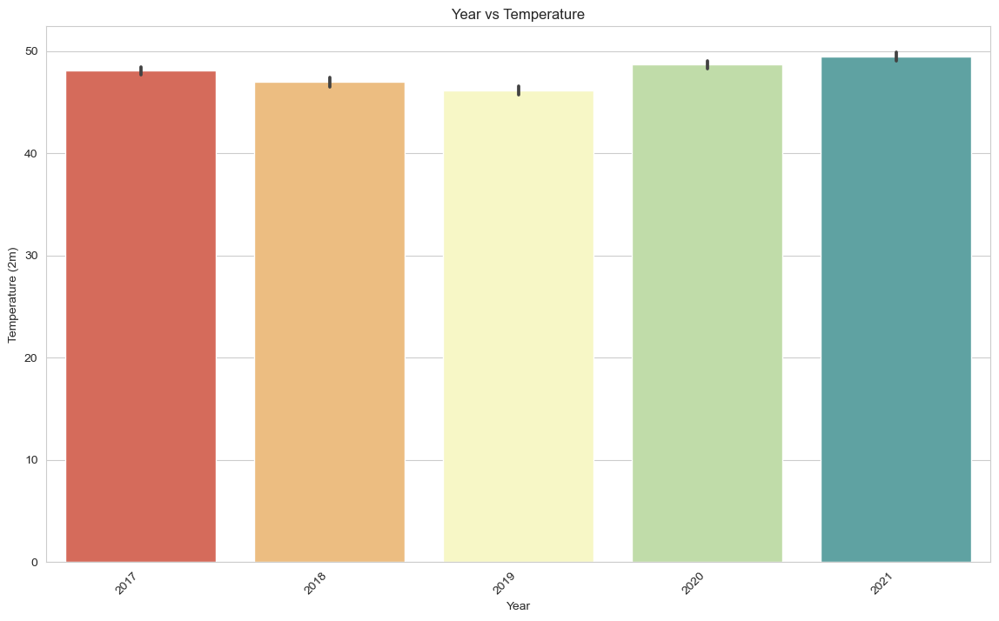

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Bar plot: Average temperature per year
plt.figure(figsize=(14, 8))
sns.barplot(x='Year', y='temperature_2m', data=df1, palette='Spectral')
plt.title('Year vs Temperature')
plt.xlabel('Year')
plt.ylabel('Temperature (2m)')
plt.xticks(rotation=45, ha='right')
plt.show()

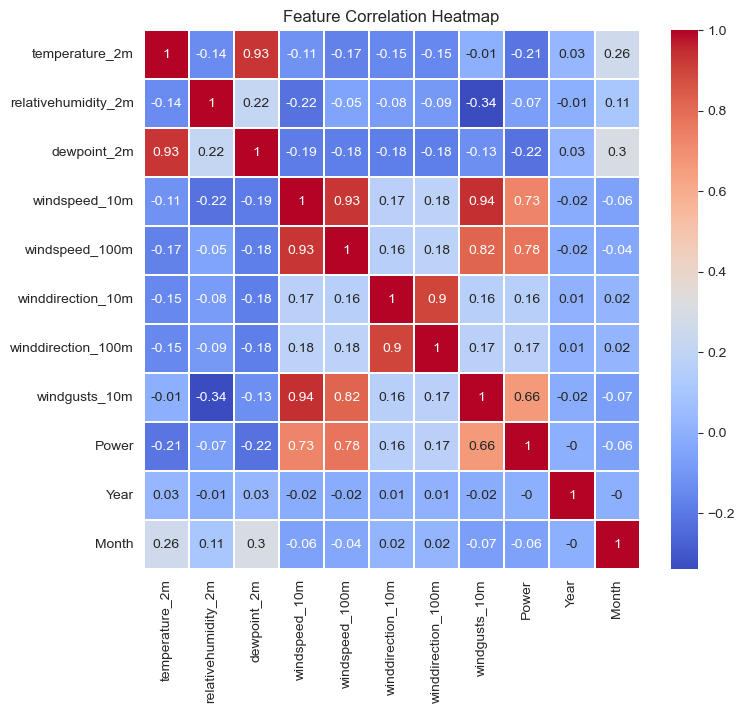

In [15]:
# 2. Correlation heatmap for selected features
plt.figure(figsize=(8, 7))
corr = df1.iloc[:, 1:12].corr().round(2)
sns.heatmap(corr, cmap='coolwarm', annot=True, linewidths=0.1)
plt.title('Feature Correlation Heatmap')
plt.show()

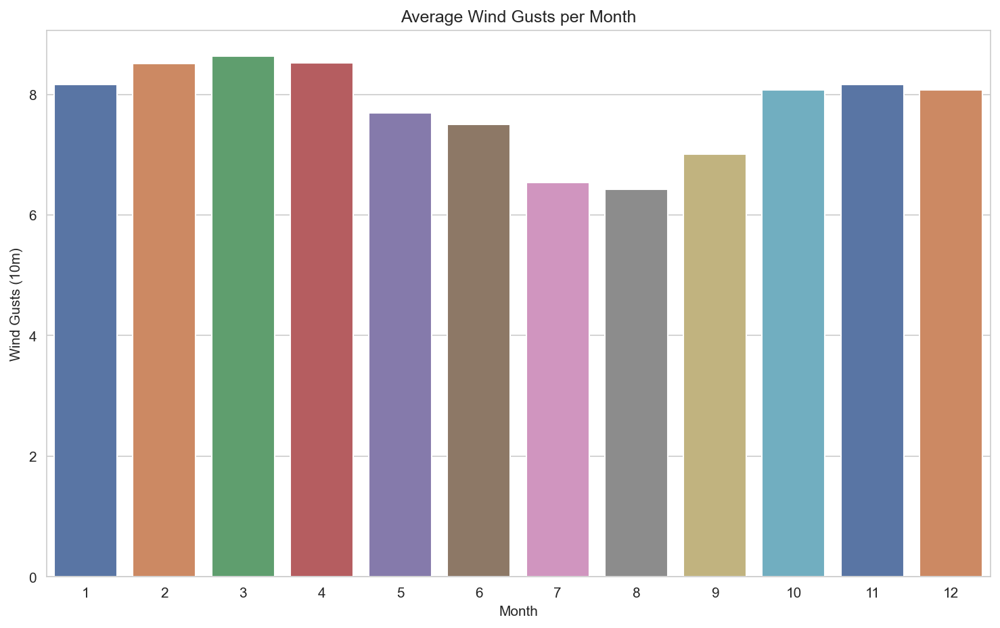

In [16]:
# 3. Bar plot: Average wind gusts per month
windgusts_month = df1.groupby("Month")["windgusts_10m"].mean()
plt.figure(figsize=(12, 7), dpi=150)
sns.barplot(x=windgusts_month.index, y=windgusts_month.values, palette='deep')
plt.xlabel("Month")
plt.ylabel("Wind Gusts (10m)")
plt.title("Average Wind Gusts per Month")
plt.show()

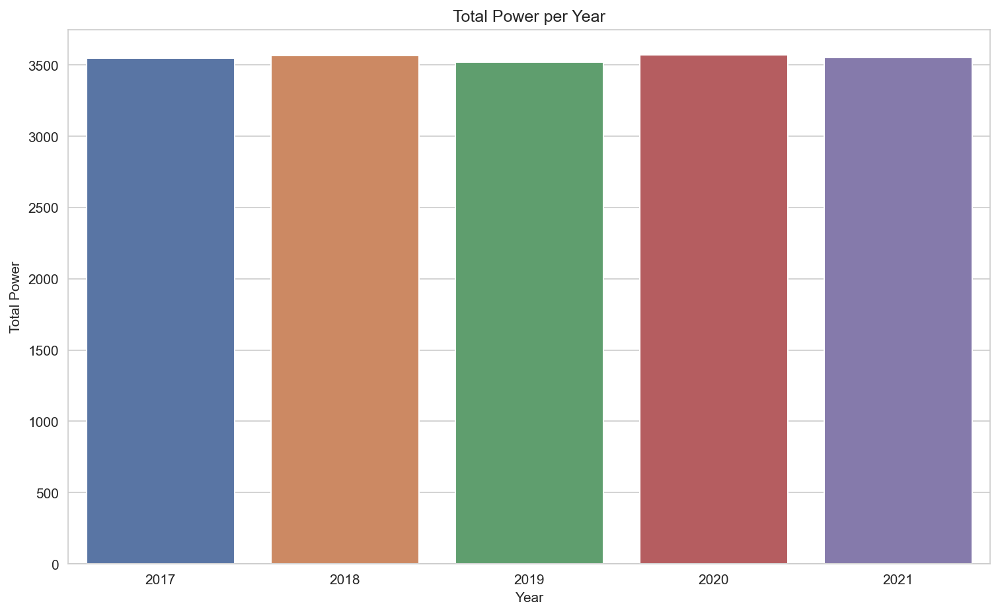

In [17]:
# 4. Bar plot: Total power per year
power_year = df1.groupby("Year")["Power"].sum()
plt.figure(figsize=(12, 7), dpi=150)
sns.barplot(x=power_year.index, y=power_year.values, palette='deep')
plt.xlabel("Year")
plt.ylabel("Total Power")
plt.title("Total Power per Year")
plt.show()

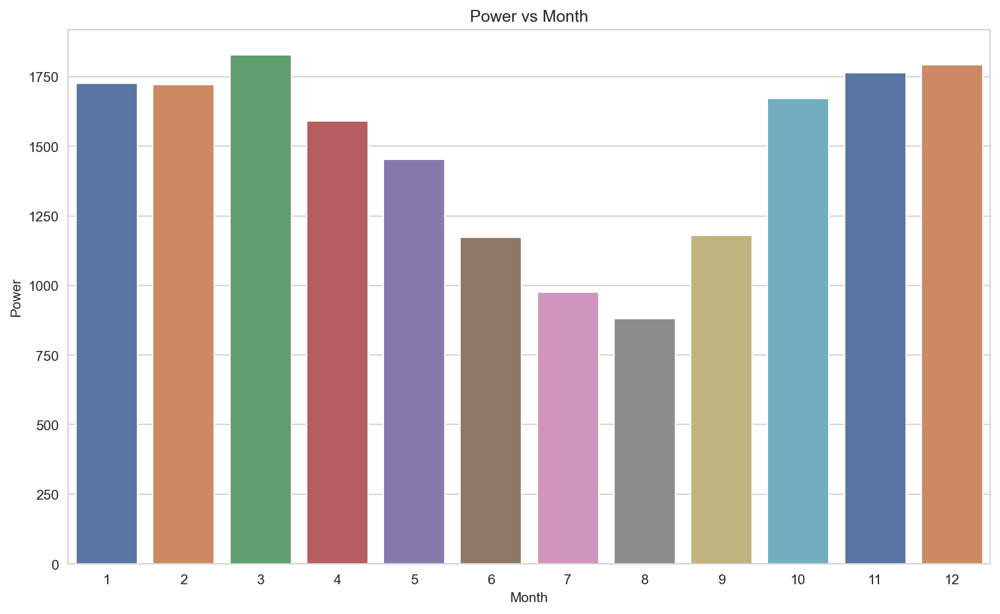

In [18]:
# 5. Bar plot: Monthly total power
monthly_power = df1.groupby("Month")["Power"].sum().sort_values(ascending=False)
plt.figure(figsize=(12, 7), dpi=150)
sns.barplot(x=monthly_power.index, y=monthly_power.values, palette='deep')
plt.xlabel("Month")
plt.ylabel("Power")
plt.title("Power vs Month")
plt.show()

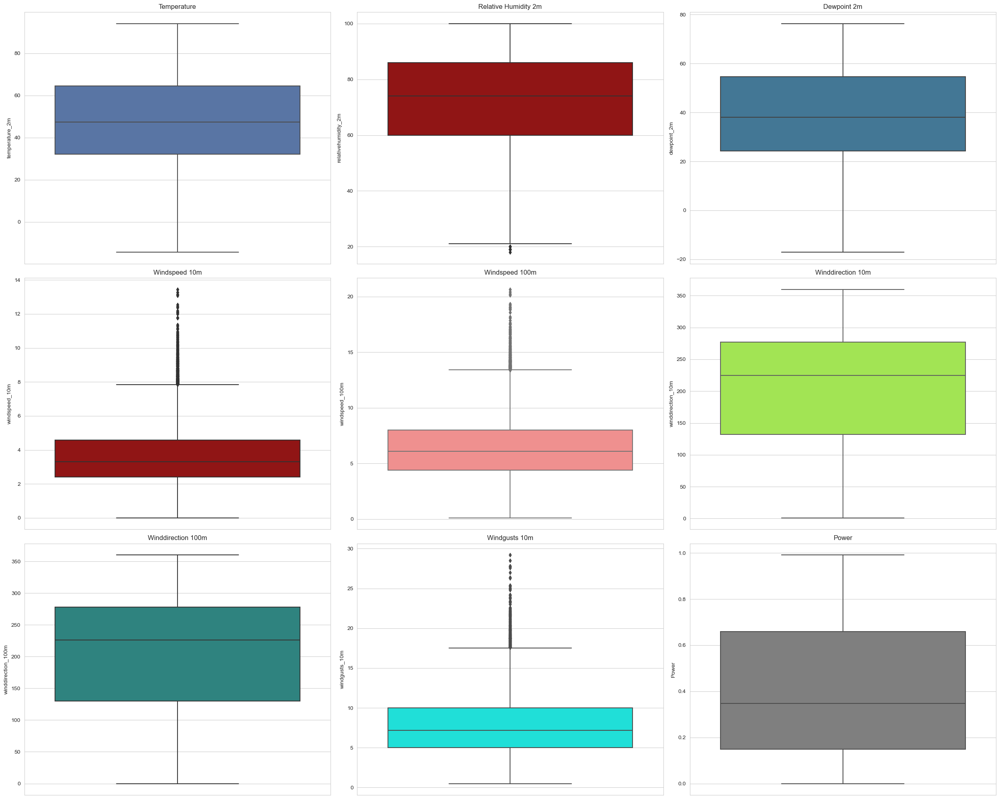

In [19]:
# 6. Boxplots for all main features

# Create a 3x3 grid of subplots with specified figure size
fig, axes = plt.subplots(3, 3, figsize=(25, 20))

# Set the color palette for all plots
sns.set_palette(palette="tab10")

# Draw boxplots for each variable in the corresponding subplot
sns.boxplot(data=df1, y="temperature_2m", palette='deep', ax=axes[0,0]).set(xlabel='', ylabel='temperature_2m', title='Temperature')
sns.boxplot(data=df1, y="relativehumidity_2m", palette='flag', ax=axes[0,1]).set(xlabel='', ylabel='relativehumidity_2m', title='Relative Humidity 2m')
sns.boxplot(data=df1, y="dewpoint_2m", palette='mako', ax=axes[0,2]).set(xlabel='', ylabel='dewpoint_2m', title='Dewpoint 2m')
sns.boxplot(data=df1, y="windspeed_10m", palette='flag', ax=axes[1,0]).set(xlabel='', ylabel='windspeed_10m', title='Windspeed 10m')
sns.boxplot(data=df1, y="windspeed_100m", palette='spring', ax=axes[1,1]).set(xlabel='', ylabel='windspeed_100m', title='Windspeed 100m')
sns.boxplot(data=df1, y="winddirection_10m", palette='turbo', ax=axes[1,2]).set(xlabel='', ylabel='winddirection_10m', title='Winddirection 10m')
sns.boxplot(data=df1, y="winddirection_100m", palette='viridis', ax=axes[2,0]).set(xlabel='', ylabel='winddirection_100m', title='Winddirection 100m')
sns.boxplot(data=df1, y="windgusts_10m", palette='hsv', ax=axes[2,1]).set(xlabel='', ylabel='windgusts_10m', title='Windgusts 10m')
sns.boxplot(data=df1, y="Power", palette='binary', ax=axes[2,2]).set(xlabel='', ylabel='Power', title='Power')

# Adjust the layout to prevent overlap
plt.tight_layout()
# Display the plot
plt.show()

In [20]:
# 7. Outlier removal using z-score

# Define the columns to check for outliers
columns = ['temperature_2m', 'relativehumidity_2m', 'dewpoint_2m',
           'windspeed_10m', 'windspeed_100m', 'winddirection_10m',
           'winddirection_100m', 'windgusts_10m', 'Power']
threshold = 2  # Set the z-score threshold

# Loop through each column and remove outliers based on z-score
for i in columns:
    mean = np.mean(df1[i])  # Calculate mean
    std = np.std(df1[i])    # Calculate standard deviation
    z_scores = np.abs((df1[i] - mean) / std)  # Compute z-scores
    outliers = z_scores > threshold           # Identify outliers
    print("Removed outliers:")                # Print message
    df1 = df1[~outliers]                      # Remove outliers from the DataFrame

Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:


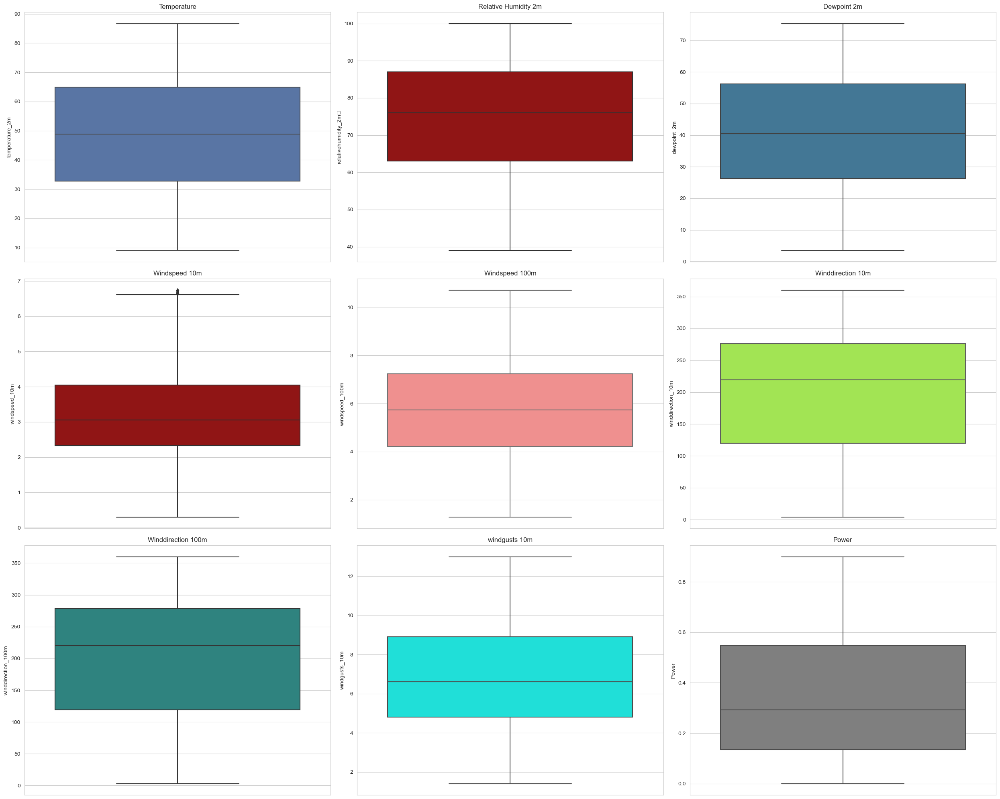

In [21]:
# 8. Boxplots after outlier removal
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.set_palette(palette="tab10")
sns.boxplot(data=df1, y= "temperature_2m",palette = 'deep',ax=axes[0,0]).set(xlabel='',ylabel='temperature_2m', title='Temperature')
sns.boxplot(data=df1, y= "relativehumidity_2m",palette = 'flag',ax=axes[0,1]).set(xlabel='',ylabel='relativehumidity_2m	', title='Relative Humidity 2m')
sns.boxplot(data=df1, y= "dewpoint_2m",palette = 'mako',ax=axes[0,2]).set(xlabel='',ylabel='dewpoint_2m', title='Dewpoint 2m')
sns.boxplot(data=df1, y= "windspeed_10m",palette = 'flag',ax=axes[1,0]).set(xlabel='',ylabel='windspeed_10m', title='Windspeed 10m')
sns.boxplot(data=df1, y= "windspeed_100m",palette = 'spring',ax=axes[1,1]).set(xlabel='',ylabel='windspeed_100m', title='Windspeed 100m')
sns.boxplot(data=df1, y= "winddirection_10m",palette = 'turbo',ax=axes[1,2]).set(xlabel='',ylabel='winddirection_10m', title='Winddirection 10m')
sns.boxplot(data=df1, y= "winddirection_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='',ylabel='winddirection_100m', title='Winddirection 100m')
sns.boxplot(data=df1, y= "windgusts_10m",palette = 'hsv',ax=axes[2,1]).set(xlabel='',ylabel='windgusts_10m', title='windgusts 10m')
sns.boxplot(data=df1, y= "Power",palette = 'binary',ax=axes[2,2]).set(xlabel='',ylabel='Power', title='Power')
plt.tight_layout()
plt.show()

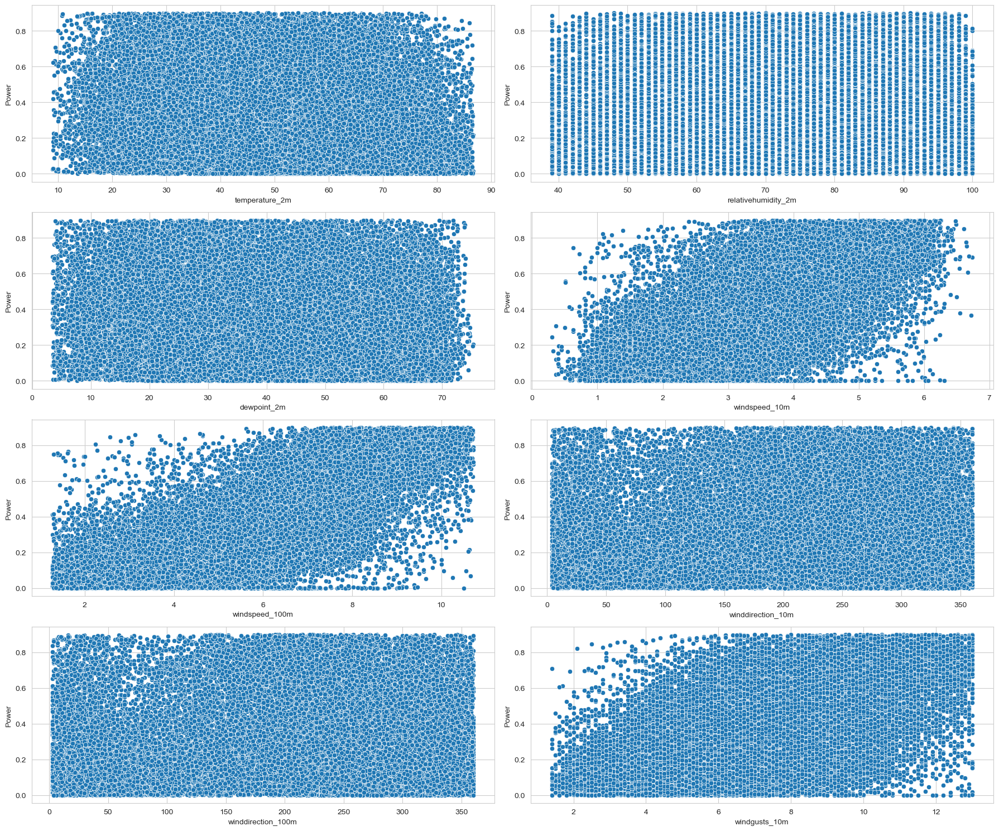

In [24]:
# 9. Scatter plots: Power vs each feature
# 定义特征列名
features = [
    'temperature_2m', 'relativehumidity_2m', 'dewpoint_2m',
    'windspeed_10m', 'windspeed_100m', 'winddirection_10m',
    'winddirection_100m', 'windgusts_10m', 'Power'
]
fig, axes = plt.subplots(4, 2, figsize=(18, 15))
for idx, feature in enumerate(features[:-1]):
    row, col = divmod(idx, 2)
    sns.scatterplot(data=df1, x=feature, y="Power", ax=axes[row, col])
    axes[row, col].set_xlabel(feature)
    axes[row, col].set_ylabel('Power')
plt.tight_layout()
plt.show()

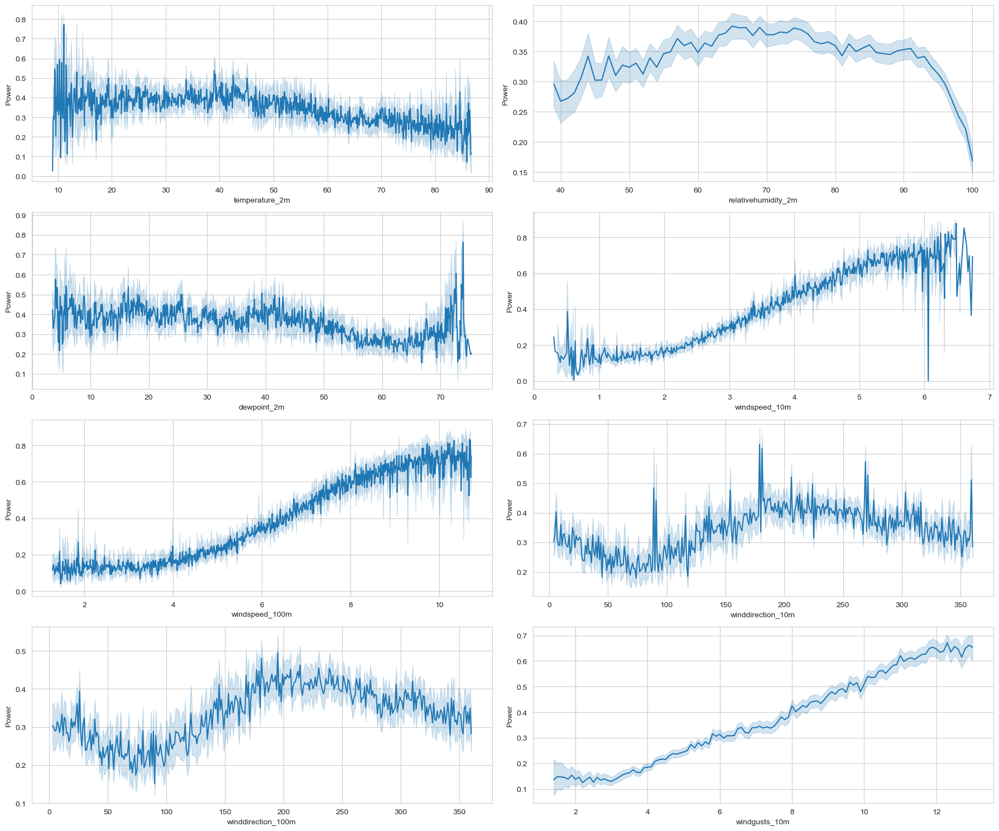

In [29]:
# 10. Line plots: Power vs each feature
fig, axes = plt.subplots(4, 2, figsize=(18, 15))
for idx, feature in enumerate(features[:-1]):
    row, col = divmod(idx, 2)
    sns.lineplot(data=df1, x=feature, y="Power", ax=axes[row, col])
    axes[row, col].set_xlabel(feature)
    axes[row, col].set_ylabel('Power')
plt.tight_layout()
plt.show()

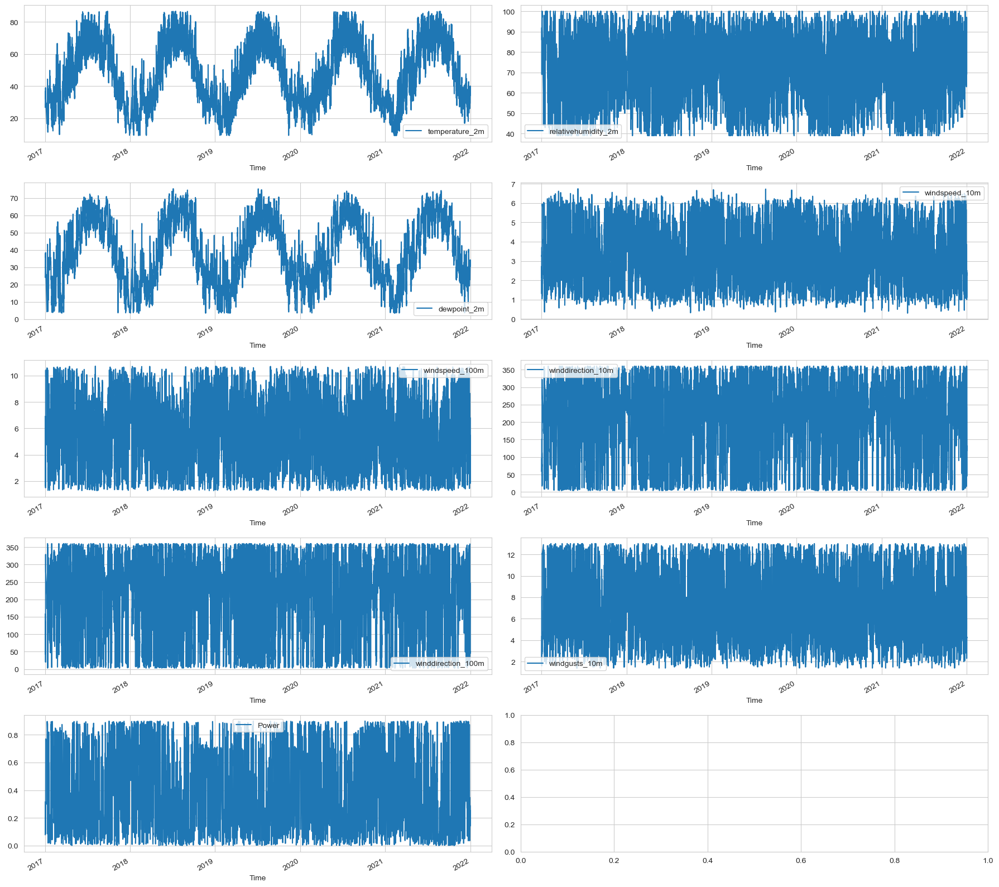

In [30]:
# 11. Time series plots for all features
fig, axes = plt.subplots(5, 2, figsize=(18, 16))
for idx, feature in enumerate(features):
    row, col = divmod(idx, 2)
    df1.plot('Time', feature, ax=axes[row, col])
plt.tight_layout()
plt.show()

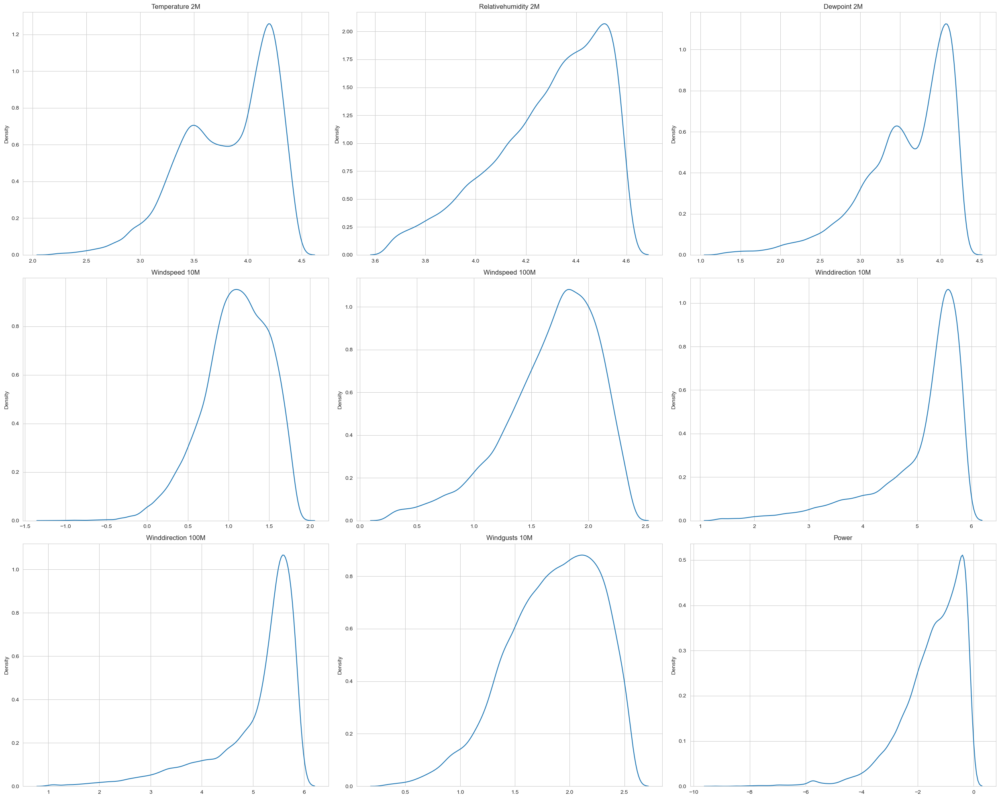

In [31]:
# 12. KDE plots (log scale) for all features
fig, axes = plt.subplots(3, 3, figsize=(25, 20))
for idx, feature in enumerate(features):
    row, col = divmod(idx, 3)
    sns.kdeplot(np.log(df1[feature]), ax=axes[row, col]).set(
        xlabel='', title=feature.replace('_', ' ').title())
plt.tight_layout()
plt.show()

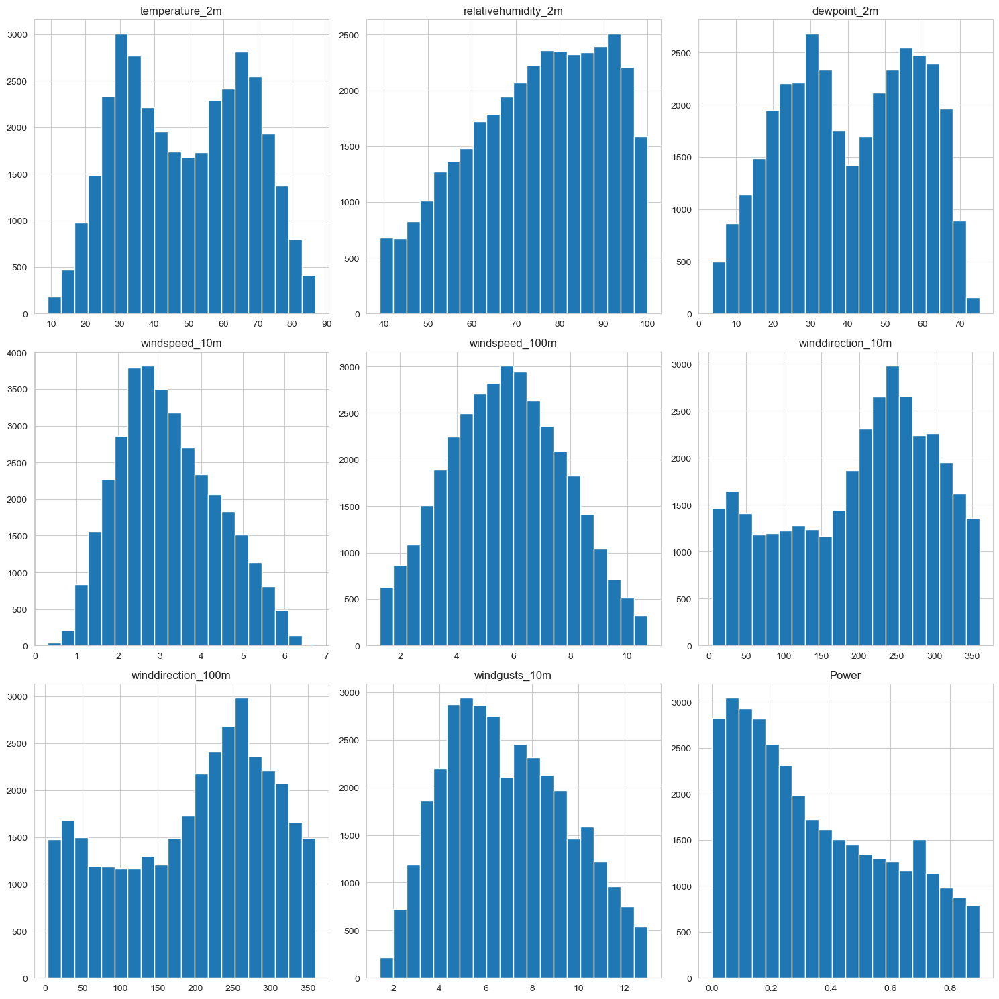

In [32]:
# 13. Histogram for all features
df1[features].hist(bins=20, figsize=(15, 15))
plt.tight_layout()
plt.show()

<AxesSubplot:xlabel='Year'>

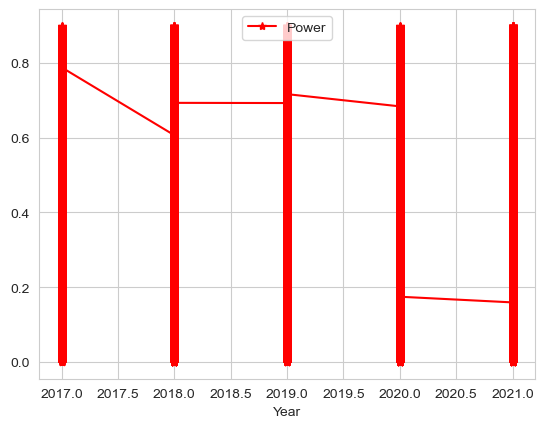

In [33]:
# 14. Yearly power trend
df1.plot('Year','Power',color='red',marker='*')

# **Utilizing 2nd Location**

In [34]:
df2.describe()

,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power
count,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000
mean,42.725605,69.085091,32.215932,4.693236,7.572439,208.512626,206.555594,8.557470,0.249902
std,23.724354,17.317481,21.307625,2.238572,3.381060,103.088845,104.882857,3.710385,0.209088
min,-31.200000,16.000000,-36.200000,0.000000,0.100000,1.000000,0.000000,0.500000,0.000000
25%,26.100000,56.000000,18.600000,3.010000,5.110000,135.000000,129.000000,5.800000,0.076200
50%,42.700000,71.000000,32.000000,4.440000,7.400000,224.000000,218.000000,8.200000,0.194950
75%,63.000000,83.000000,50.600000,6.040000,9.740000,300.000000,302.000000,10.800000,0.381800
max,95.400000,100.000000,76.600000,18.270000,24.590000,360.000000,360.000000,29.000000,0.985900


In [35]:
df2.isnull().sum()

Time                   0
temperature_2m         0
relativehumidity_2m    0
dewpoint_2m            0
windspeed_10m          0
windspeed_100m         0
winddirection_10m      0
winddirection_100m     0
windgusts_10m          0
Power                  0
dtype: int64

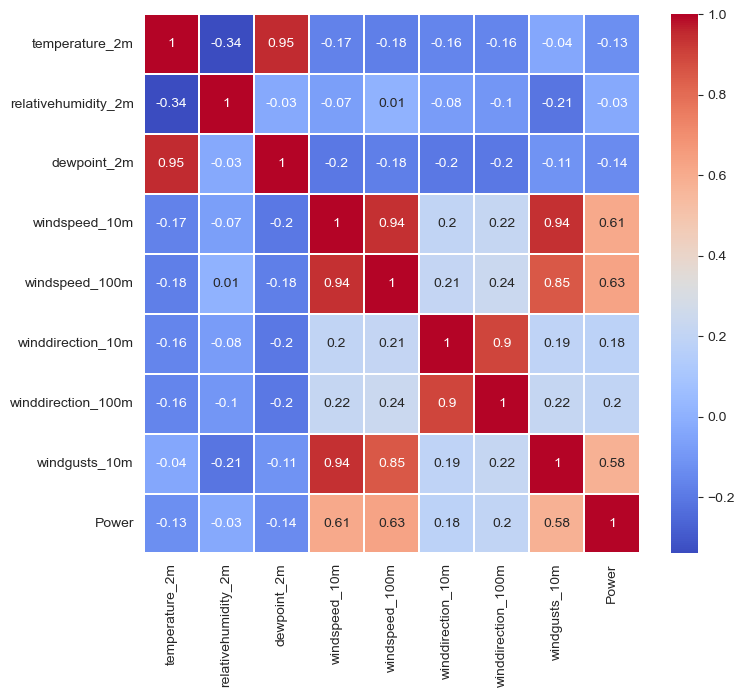

In [36]:
fig, axes = plt.subplots(figsize=(8,7))
corrdata=sns.heatmap(round(df2.iloc[:,1:12].corr(),2), cmap='coolwarm', annot=True,linewidths=0.1)
plt.show()

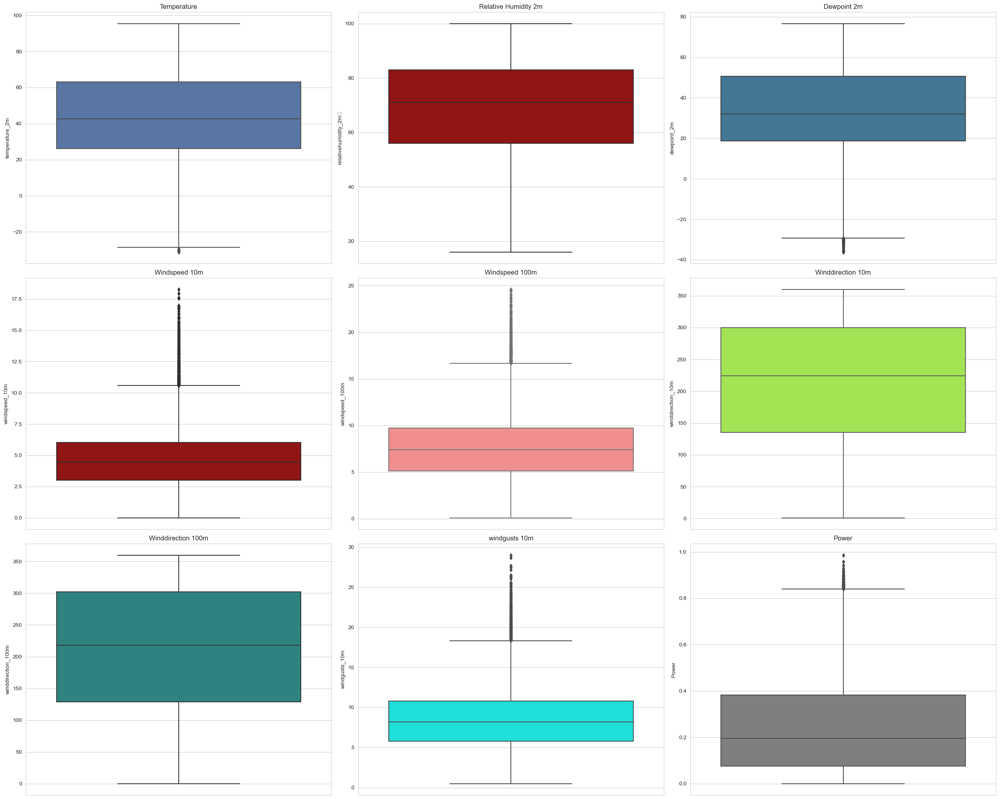

In [37]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.set_palette(palette="tab10")
sns.boxplot(data=df2, y= "temperature_2m",palette = 'deep',ax=axes[0,0]).set(xlabel='',ylabel='temperature_2m', title='Temperature')
sns.boxplot(data=df2, y= "relativehumidity_2m",palette = 'flag',ax=axes[0,1]).set(xlabel='',ylabel='relativehumidity_2m	', title='Relative Humidity 2m')
sns.boxplot(data=df2, y= "dewpoint_2m",palette = 'mako',ax=axes[0,2]).set(xlabel='',ylabel='dewpoint_2m', title='Dewpoint 2m')
sns.boxplot(data=df2, y= "windspeed_10m",palette = 'flag',ax=axes[1,0]).set(xlabel='',ylabel='windspeed_10m', title='Windspeed 10m')
sns.boxplot(data=df2, y= "windspeed_100m",palette = 'spring',ax=axes[1,1]).set(xlabel='',ylabel='windspeed_100m', title='Windspeed 100m')
sns.boxplot(data=df2, y= "winddirection_10m",palette = 'turbo',ax=axes[1,2]).set(xlabel='',ylabel='winddirection_10m', title='Winddirection 10m')
sns.boxplot(data=df2, y= "winddirection_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='',ylabel='winddirection_100m', title='Winddirection 100m')
sns.boxplot(data=df2, y= "windgusts_10m",palette = 'hsv',ax=axes[2,1]).set(xlabel='',ylabel='windgusts_10m', title='windgusts 10m')
sns.boxplot(data=df2, y= "Power",palette = 'binary',ax=axes[2,2]).set(xlabel='',ylabel='Power', title='Power')
plt.tight_layout()
plt.show()

In [38]:
columns=['temperature_2m', 'relativehumidity_2m', 'dewpoint_2m',
       'windspeed_10m', 'windspeed_100m', 'winddirection_10m',
       'winddirection_100m', 'windgusts_10m', 'Power']
threshold = 2
for i in columns:
    mean = np.mean(df2[i])
    std = np.std(df2[i])
    z_scores = np.abs((df2[i] - mean) / std)
    outliers = z_scores > threshold
    print("Removed outliers:")
    df2 = df2[~outliers]

Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:


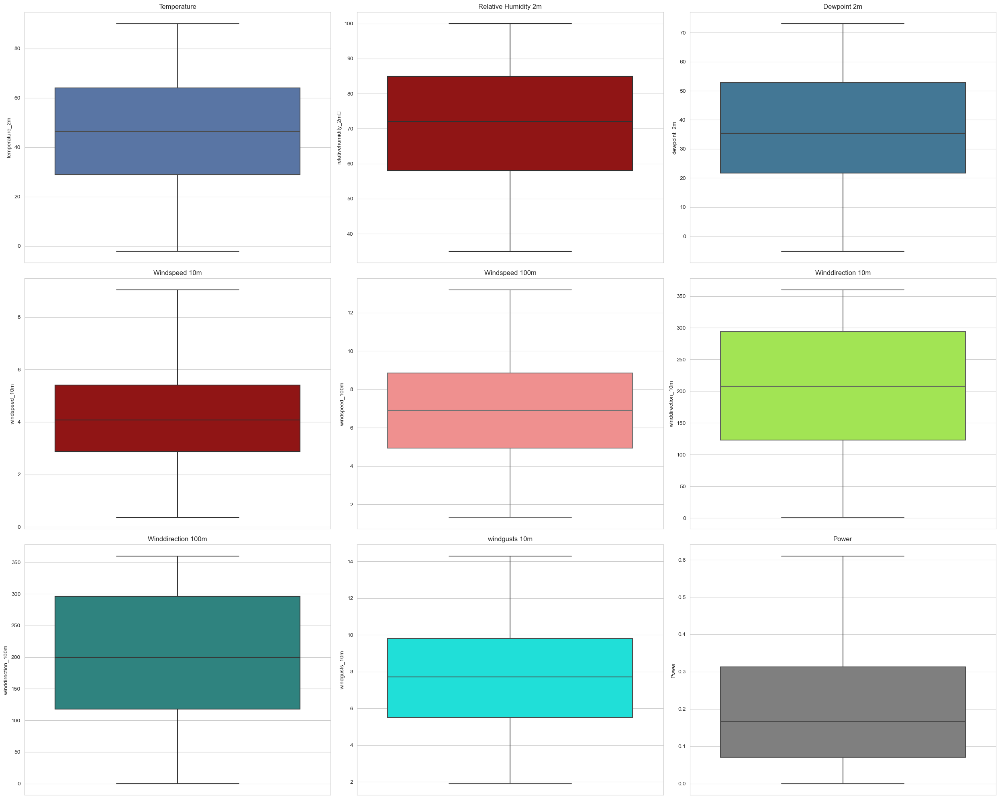

In [39]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.set_palette(palette="tab10")
sns.boxplot(data=df2, y= "temperature_2m",palette = 'deep',ax=axes[0,0]).set(xlabel='',ylabel='temperature_2m', title='Temperature')
sns.boxplot(data=df2, y= "relativehumidity_2m",palette = 'flag',ax=axes[0,1]).set(xlabel='',ylabel='relativehumidity_2m	', title='Relative Humidity 2m')
sns.boxplot(data=df2, y= "dewpoint_2m",palette = 'mako',ax=axes[0,2]).set(xlabel='',ylabel='dewpoint_2m', title='Dewpoint 2m')
sns.boxplot(data=df2, y= "windspeed_10m",palette = 'flag',ax=axes[1,0]).set(xlabel='',ylabel='windspeed_10m', title='Windspeed 10m')
sns.boxplot(data=df2, y= "windspeed_100m",palette = 'spring',ax=axes[1,1]).set(xlabel='',ylabel='windspeed_100m', title='Windspeed 100m')
sns.boxplot(data=df2, y= "winddirection_10m",palette = 'turbo',ax=axes[1,2]).set(xlabel='',ylabel='winddirection_10m', title='Winddirection 10m')
sns.boxplot(data=df2, y= "winddirection_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='',ylabel='winddirection_100m', title='Winddirection 100m')
sns.boxplot(data=df2, y= "windgusts_10m",palette = 'hsv',ax=axes[2,1]).set(xlabel='',ylabel='windgusts_10m', title='windgusts 10m')
sns.boxplot(data=df2, y= "Power",palette = 'binary',ax=axes[2,2]).set(xlabel='',ylabel='Power', title='Power')
plt.tight_layout()
plt.show()

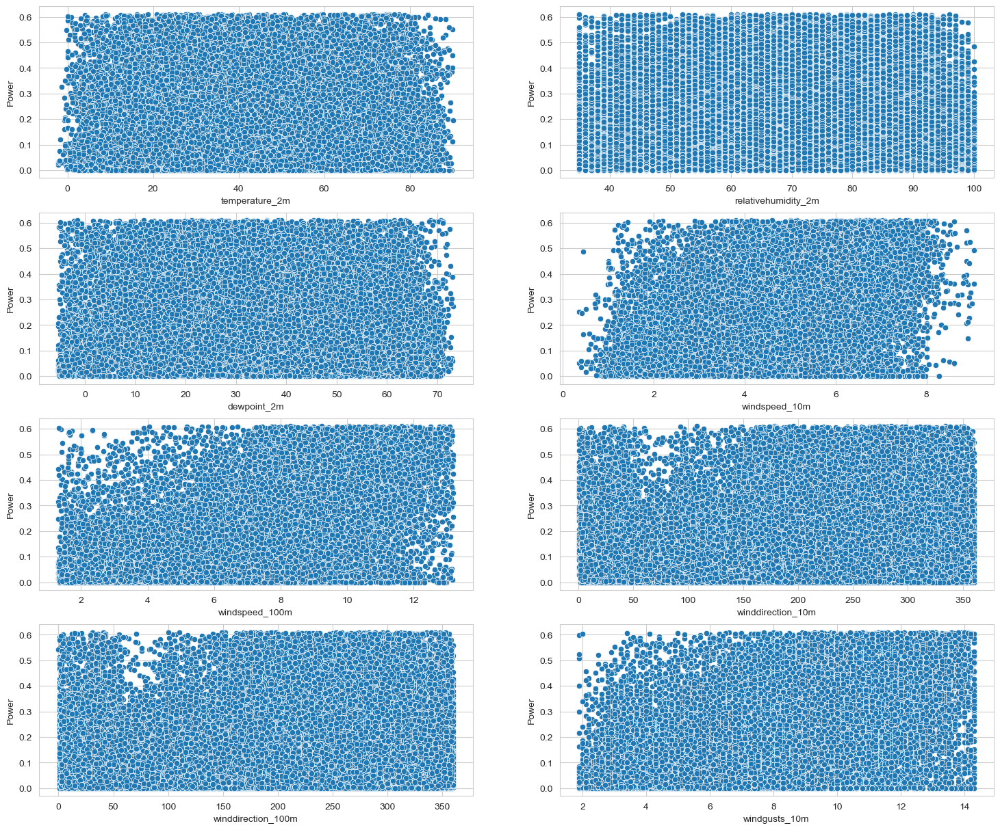

In [40]:
fig, axes = plt.subplots(4,2, figsize=(18,15))
sns.scatterplot(data=df2, y= "Power",x="temperature_2m",palette = 'viridis',ax=axes[0,0]).set(xlabel='temperature_2m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "relativehumidity_2m",palette = 'deep',ax=axes[0,1]).set(xlabel='relativehumidity_2m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power",x= "dewpoint_2m",palette = 'viridis',ax=axes[1,0]).set(xlabel='dewpoint_2m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "windspeed_10m",palette = 'deep',ax=axes[1,1]).set(xlabel='windspeed_10m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "windspeed_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='windspeed_100m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "winddirection_10m",palette = 'deep',ax=axes[2,1]).set(xlabel='winddirection_10m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "winddirection_100m",palette = 'viridis',ax=axes[3,0]).set(xlabel='winddirection_100m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "windgusts_10m",palette = 'deep',ax=axes[3,1]).set(xlabel='windgusts_10m',ylabel='Power')
plt.show()

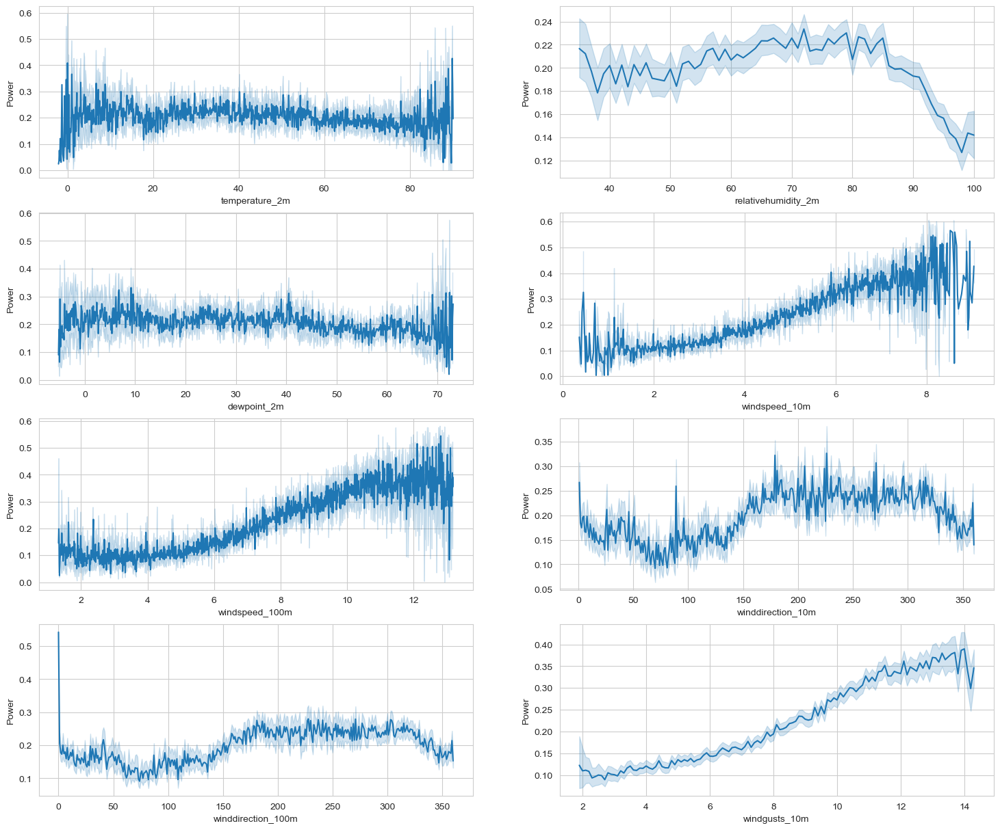

In [41]:
fig, axes = plt.subplots(4,2, figsize=(18,15))
sns.lineplot(data=df2, y= "Power",x="temperature_2m",palette = 'viridis',ax=axes[0,0]).set(xlabel='temperature_2m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "relativehumidity_2m",palette = 'deep',ax=axes[0,1]).set(xlabel='relativehumidity_2m',ylabel='Power')
sns.lineplot(data=df2, y= "Power",x= "dewpoint_2m",palette = 'viridis',ax=axes[1,0]).set(xlabel='dewpoint_2m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "windspeed_10m",palette = 'deep',ax=axes[1,1]).set(xlabel='windspeed_10m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "windspeed_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='windspeed_100m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "winddirection_10m",palette = 'deep',ax=axes[2,1]).set(xlabel='winddirection_10m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "winddirection_100m",palette = 'viridis',ax=axes[3,0]).set(xlabel='winddirection_100m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "windgusts_10m",palette = 'deep',ax=axes[3,1]).set(xlabel='windgusts_10m',ylabel='Power')
plt.show()

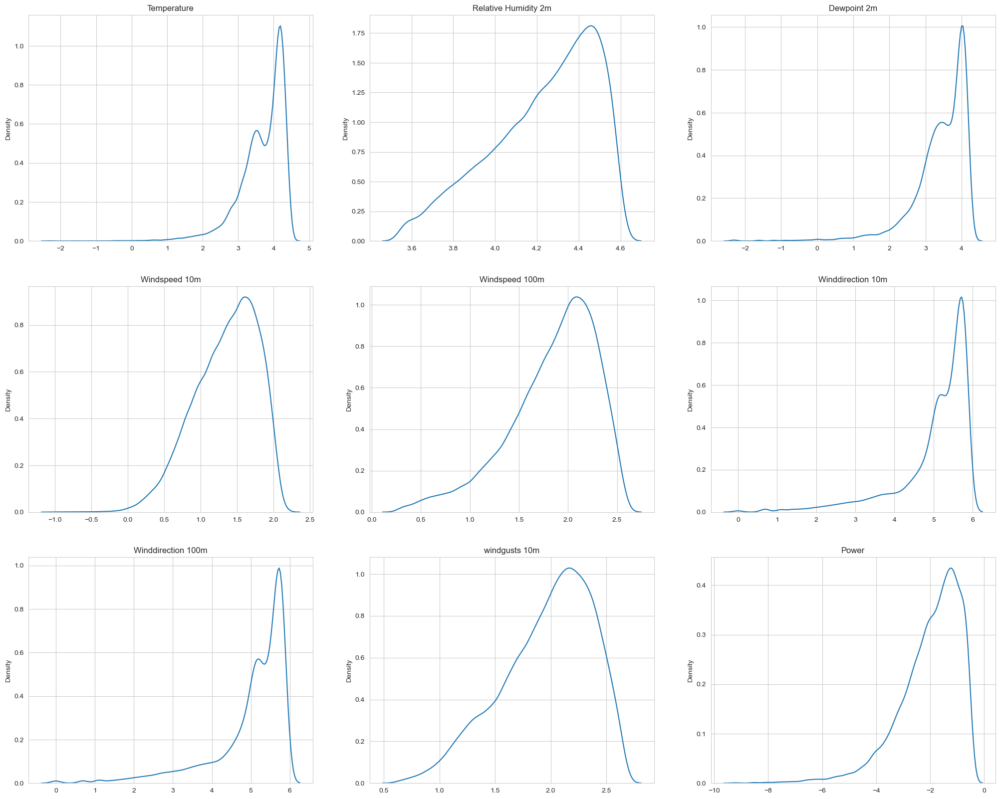

In [42]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.kdeplot(np.log(df2['temperature_2m']),ax=axes[0,0]).set(xlabel='', title='Temperature')
sns.kdeplot(np.log(df2['relativehumidity_2m']),ax=axes[0,1]).set(xlabel='', title='Relative Humidity 2m')
sns.kdeplot(np.log(df2['dewpoint_2m']),ax=axes[0,2]).set(xlabel='', title='Dewpoint 2m')
sns.kdeplot(np.log(df2['windspeed_10m']),ax=axes[1,0]).set(xlabel='', title='Windspeed 10m')
sns.kdeplot(np.log(df2['windspeed_100m']),ax=axes[1,1]).set(xlabel='', title='Windspeed 100m')
sns.kdeplot(np.log(df2['winddirection_10m']),ax=axes[1,2]).set(xlabel='', title='Winddirection 10m')
sns.kdeplot(np.log(df2['winddirection_100m']),ax=axes[2,0]).set(xlabel='', title='Winddirection 100m')
sns.kdeplot(np.log(df2['windgusts_10m']),ax=axes[2,1]).set(xlabel='', title='windgusts 10m')
sns.kdeplot(np.log(df2['Power']),ax=axes[2,2]).set(xlabel='', title='Power')
plt.show()

In [43]:
print("Hypothesis Testing")
print("---"*50)
print("H0 : There is no change in power generation due to the location")
print("H1 : There is change in power generation due to the location")

Hypothesis Testing
------------------------------------------------------------------------------------------------------------------------------------------------------
H0 : There is no change in power generation due to the location
H1 : There is change in power generation due to the location


# Hypothesis Testing

**T-Test**(#5)

In [44]:
# 1. Independent samples t-test
group1 = df1['Power']
group2 = df2['Power']
t_stat, t_p = stats.ttest_ind(group1, group2)
print("T-Test Statistic:", t_stat)
print("T-Test P-Value:", t_p)

T-Test Statistic: 90.11226155717033
T-Test P-Value: 0.0


**ANOVA Test**

In [47]:
# 2. One-way ANOVA test
f_stat, f_p = stats.f_oneway(group1, group2)
print("ANOVA F-Statistic:", f_stat)
print("ANOVA P-Value:", f_p)

ANOVA F-Statistic: 8120.219682947879
ANOVA P-Value: 0.0


**Chi Square Test**

In [48]:
# 3. Chi-square test for independence
import scipy.stats as stats

observed_values = pd.crosstab(df1['Power'], df2['Power']).values
# Perform chi-square test
chi2_stat, p_value, dof, expected = stats.chi2_contingency(observed_values)
# Print the results
print("Chi-Square Statistic:", chi2_stat)
print("P-Value:", p_value)

Chi-Square Statistic: 47657149.62895133
P-Value: 0.0


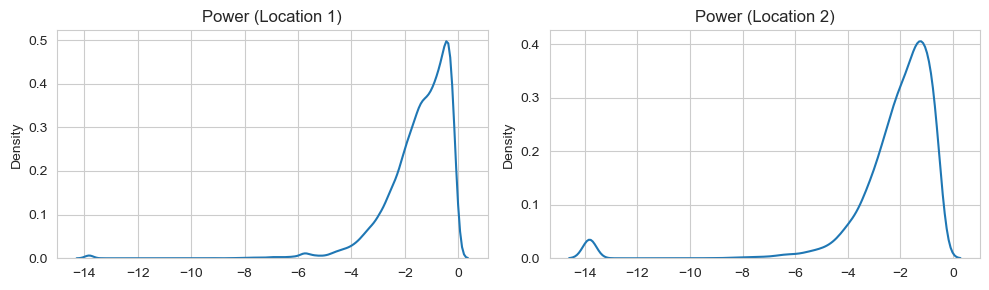

In [49]:
# 4. Visualize log-power distributions for both locations
fig, axes = plt.subplots(1, 2, figsize=(10, 3))
sns.kdeplot(np.log(group1 + 1e-6), ax=axes[0]).set(xlabel='', title='Power (Location 1)')
sns.kdeplot(np.log(group2 + 1e-6), ax=axes[1]).set(xlabel='', title='Power (Location 2)')
plt.tight_layout()
plt.show()

In [50]:
# 5. Print conclusion based on p-values
print("Given the p-values from the T-Test, ANOVA, and Chi-Square Test,")
print("it is concluded that the null hypothesis (H0) is accepted, and the alternative hypothesis (H1) is rejected.")

Given the p-values from the T-Test, ANOVA, and Chi-Square Test,
it is concluded that the null hypothesis (H0) is accepted, and the alternative hypothesis (H1) is rejected.


In [51]:
# 6. Check for missing and duplicate values
print("Shape of df1:", df1.shape)
print("Missing values in df1:\n", df1.isnull().sum())
duplicates = df1[df1.duplicated()]
print("Duplicate rows in df1:\n", duplicates)
if duplicates.empty:
    print("There are no duplicate values.")

Shape of df1: (35125, 14)
Missing values in df1:
 Time                   0
temperature_2m         0
relativehumidity_2m    0
dewpoint_2m            0
windspeed_10m          0
windspeed_100m         0
winddirection_10m      0
winddirection_100m     0
windgusts_10m          0
Power                  0
Year                   0
Month                  0
Quarter                0
Day                    0
dtype: int64
Duplicate rows in df1:
 Empty DataFrame
Columns: [Time, temperature_2m, relativehumidity_2m, dewpoint_2m, windspeed_10m, windspeed_100m, winddirection_10m, winddirection_100m, windgusts_10m, Power, Year, Month, Quarter, Day]
Index: []
There are no duplicate values.


# **Splitting the Dataset**

Train, validation, and test sets have been saved.
x_train shape: (30607, 1, 52)
x_val shape: (6518, 1, 52)
x_test shape: (6519, 1, 52)
y_train shape: (30607,)
y_val shape: (6518,)
y_test shape: (6519,)


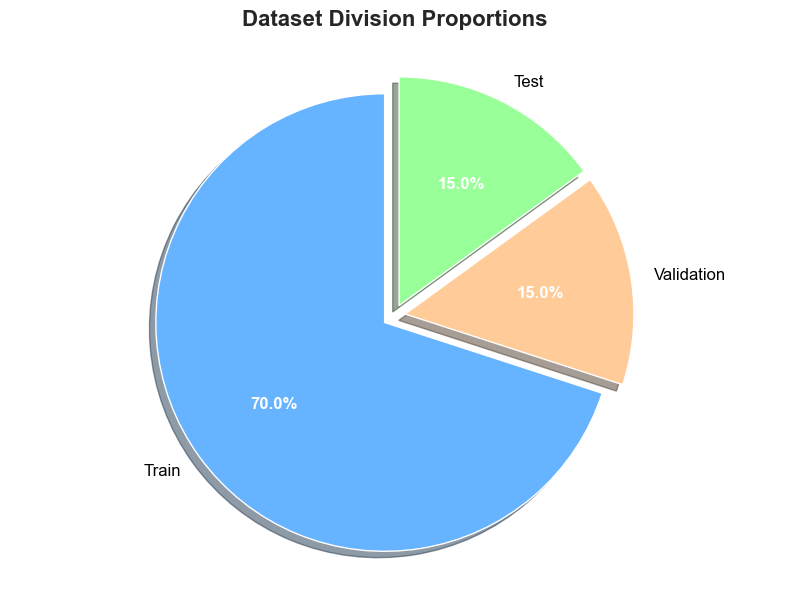

In [4]:
# Split the dataset into train, validation, and test sets (70:15:15)
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# 1. Divide the dataset into train, validation, and test sets
total_len = len(df1)
train_size = int(0.7 * total_len)
val_size = int(0.15 * total_len)
test_size = total_len - train_size - val_size

univariate_df = df1[['Time', 'Power']].copy()
univariate_df.columns = ['ds', 'y']

train_df = univariate_df.iloc[:train_size]
val_df = univariate_df.iloc[train_size:train_size+val_size]
test_df = univariate_df.iloc[train_size+val_size:]

# 2. Create directories and save the datasets
for folder in ['train', 'val', 'test']:
    os.makedirs(folder, exist_ok=True)
train_df.to_csv('train/train.csv', index=False)
val_df.to_csv('val/val.csv', index=False)
test_df.to_csv('test/test.csv', index=False)

print("Train, validation, and test sets have been saved.")

# 3. Load the datasets
train_df = pd.read_csv('train/train.csv')
val_df = pd.read_csv('val/val.csv')
test_df = pd.read_csv('test/test.csv')

# 4. Scale the 'y' values using MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 0))
scaler.fit(train_df[['y']].values)
train_scaled = scaler.transform(train_df[['y']].values)
val_scaled = scaler.transform(val_df[['y']].values)
test_scaled = scaler.transform(test_df[['y']].values)

# 5. Create datasets for training, validation, and testing
def create_dataset(dataset, look_back=1):
    X, Y = [], []
    for i in range(look_back, len(dataset)):
        X.append(dataset[i-look_back:i, 0])
        Y.append(dataset[i, 0])
    return np.array(X), np.array(Y)

look_back = 52
x_train, y_train = create_dataset(train_scaled, look_back)
x_val, y_val = create_dataset(val_scaled, look_back)
x_test, y_test = create_dataset(test_scaled, look_back)

# 6. Reshape the input data to be 3D for LSTM
x_train = np.reshape(x_train, (x_train.shape[0], 1, x_train.shape[1]))
x_val = np.reshape(x_val, (x_val.shape[0], 1, x_val.shape[1]))
x_test = np.reshape(x_test, (x_test.shape[0], 1, x_test.shape[1]))

print("x_train shape:", x_train.shape)
print("x_val shape:", x_val.shape)
print("x_test shape:", x_test.shape)
print("y_train shape:", y_train.shape)
print("y_val shape:", y_val.shape)
print("y_test shape:", y_test.shape)

# Pie chart for dataset proportions
labels = ['Train', 'Validation', 'Test']
sizes = [70, 15, 15]
colors = ['#66b3ff', '#ffcc99', '#99ff99']
explode = (0.05, 0.05, 0.05)

plt.figure(figsize=(8, 6))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    explode=explode,
    shadow=True,
    textprops={'fontsize': 12, 'color': 'black'}
)
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')
plt.title('Dataset Division Proportions', fontsize=16, fontweight='bold', pad=20)
plt.axis('equal')
plt.tight_layout()
plt.show()

In [53]:
# PyTorch: Custom Weighted Dice Loss for regression/classification tasks
import torch.nn as nn
import torch.nn.functional as F

class WeightedDiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth  # Smoothing factor to avoid division by zero

    def forward(self, pred, target):
        pred = F.sigmoid(pred)  # Apply sigmoid to predictions
        intersection = (pred * target).sum()  # Calculate intersection
        dice = (2. * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)
        return 1 - dice  # Dice loss
        return 1 - dice

# **EarlyStopping**

In [107]:
# Keras: EarlyStopping callback configuration
from keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='loss',           # Monitor validation MAE
    patience=10,                  # Number of epochs with no improvement after which training will be stopped
    min_delta=0.0001,            # Minimum change to qualify as an improvement
    restore_best_weights=True    # Restore model weights from the epoch with the best value of the monitored quantity
)

# **ReduceLROnPlateau**

In [55]:
# Keras: ReduceLROnPlateau callback configuration
from keras.callbacks import ReduceLROnPlateau

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',          # Monitor validation loss
    factor=0.5,                  # Factor by which the learning rate will be reduced
    patience=3                   # Number of epochs with no improvement after which learning rate will be reduced
)

# **Building and Compiling LSTM model**

In [57]:
# Build LSTM model
model_LSTM = Sequential(name="LSTM_Model")

# First LSTM layer
model_LSTM.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1], x_train.shape[2])))
model_LSTM.add(Dropout(0.2))

# Second LSTM layer
model_LSTM.add(LSTM(64, return_sequences=False))
model_LSTM.add(Dropout(0.2))

# Fully connected layer
model_LSTM.add(Dense(25, activation='relu'))

# Output layer
model_LSTM.add(Dense(1))

# Compile the model
model_LSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)

# Train the model (using validation set)
history_LSTM = model_LSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_val, y_val),  # Use validation set for early stopping and LR scheduling
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
767/767 [==============================] - 6s 6ms/step - loss: 0.0177 - mae: 0.0897 - val_loss: 0.0045 - val_mae: 0.0486
Epoch 2/80
767/767 [==============================] - 5s 6ms/step - loss: 0.0047 - mae: 0.0491 - val_loss: 0.0033 - val_mae: 0.0380
Epoch 3/80
767/767 [==============================] - 5s 6ms/step - loss: 0.0036 - mae: 0.0415 - val_loss: 0.0025 - val_mae: 0.0262
Epoch 4/80
767/767 [==============================] - 5s 6ms/step - loss: 0.0033 - mae: 0.0386 - val_loss: 0.0023 - val_mae: 0.0246
Epoch 5/80
767/767 [==============================] - 5s 6ms/step - loss: 0.0028 - mae: 0.0347 - val_loss: 0.0026 - val_mae: 0.0256
Epoch 6/80
767/767 [==============================] - 5s 6ms/step - loss: 0.0027 - mae: 0.0337 - val_loss: 0.0030 - val_mae: 0.0371
Epoch 7/80
767/767 [==============================] - 5s 7ms/step - loss: 0.0027 - mae: 0.0338 - val_loss: 0.0022 - val_mae: 0.0242
Epoch 8/80
767/767 [==============================] - 5s 6ms/step - loss: 0.

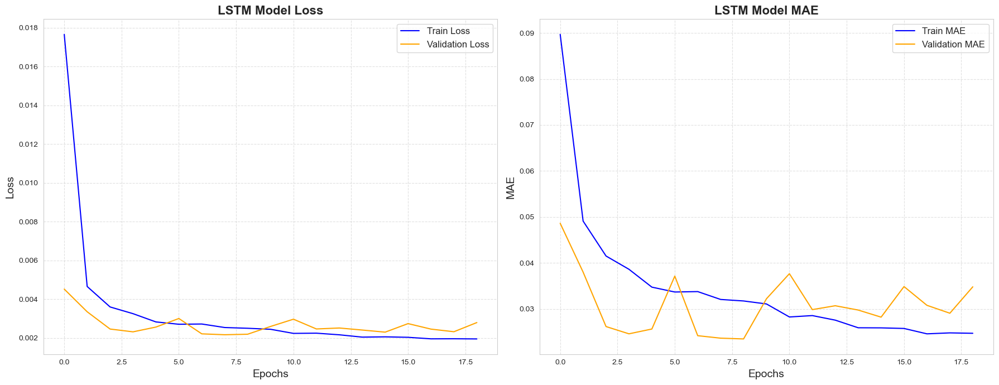

In [58]:
# Plot training and validation loss and MAE
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
axes[0].plot(history_LSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_LSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('LSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_LSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_LSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('LSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [59]:
# Display model summary
model_LSTM.summary()

Model: "LSTM_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 1, 128)            92672     
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 128)            0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dropout_3 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 25)                1625      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 26        
Total params: 143,731
Trainable params: 143,731
Non-trainable params: 0
__________________________________________________

In [60]:
#  Save the best model
model_LSTM.save('model/best_model_lstm.h5')

In [61]:
# Load the best model
best_model_LSTM = load_model('model/best_model_lstm.h5')

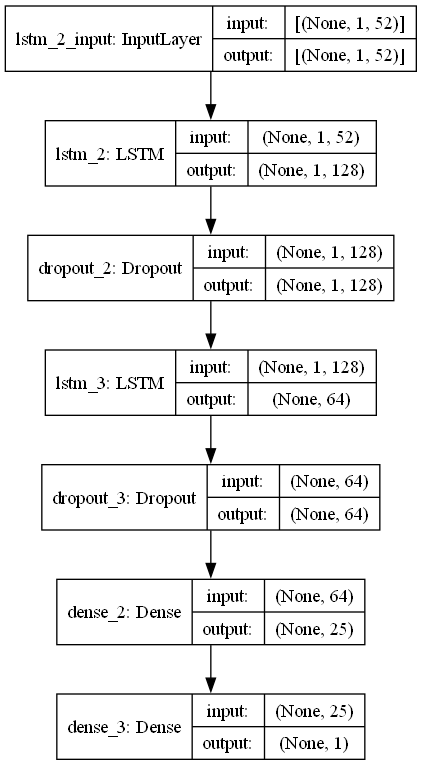

In [62]:
plot_model(best_model_LSTM, to_file='model_structure/model_lstm.png', show_shapes=True, show_layer_names=True)

# Display the model architecture
Image(filename='model_structure/model_lstm.png')

# **Evaluate Best LSTM Model**

In [63]:
# Evaluate Best LSTM model: prediction, inverse scaling, and metric calculation
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
from colorama import Fore

# Predict on train and test sets
train_predict_LSTM = best_model_LSTM.predict(x_train)
test_predict_LSTM = best_model_LSTM.predict(x_test)

# Inverse transform the predictions and actual values
train_predict_LSTM = scaler.inverse_transform(train_predict_LSTM)
y_train_LSTM = scaler.inverse_transform(y_train.reshape(-1, 1))

test_predict_LSTM = scaler.inverse_transform(test_predict_LSTM)
y_test_LSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE and MAE for train and test sets
score_rmse_LSTM = np.sqrt(mean_squared_error(y_test_LSTM, test_predict_LSTM))
score_mae_LSTM = mean_absolute_error(y_test_LSTM, test_predict_LSTM)

# Print the scores
print(Fore.GREEN + 'LSTM Model RMSE: {:.4f}'.format(score_rmse_LSTM))
print(Fore.BLUE + 'LSTM Model MAE: {:.4f}'.format(score_mae_LSTM))

# Check shapes of predictions and actual values
assert len(y_test_LSTM) == len(test_predict_LSTM), "LSTM shape mismatch"

LSTM Model RMSE: 0.0400
LSTM Model MAE: 0.0284


# **Plot LSTM Model**

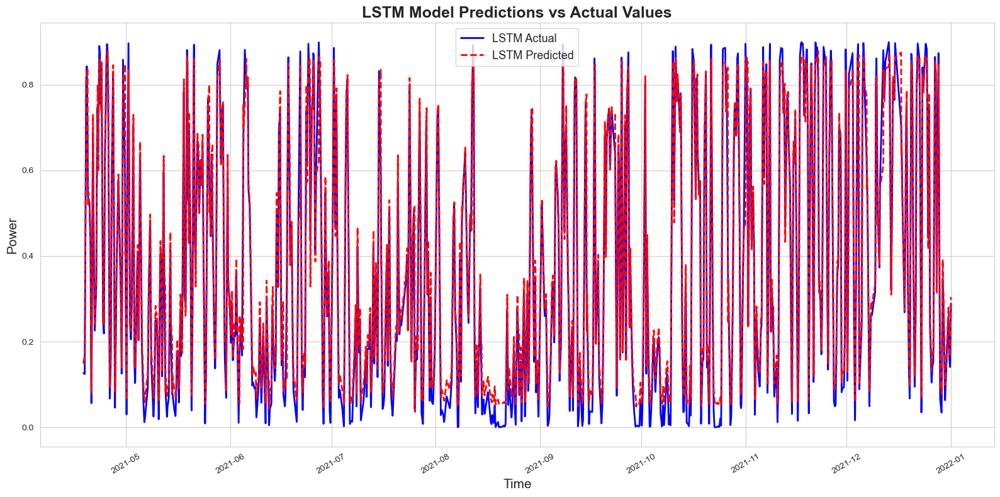

In [64]:
# Plot LSTM predictions vs actual values with time ticks and improved style
import matplotlib.pyplot as plt
import seaborn as sns

# Create time ticks for x-axis using test set timestamps
x_test_ticks_LSTM = univariate_df.tail(len(y_test_LSTM))['ds']

plt.figure(figsize=(16, 8))
sns.set_style('whitegrid')

# Plot actual values
plt.plot(x_test_ticks_LSTM, y_test_LSTM.flatten(), label='LSTM Actual', color='blue', linewidth=2)
# Plot predicted values
plt.plot(x_test_ticks_LSTM, test_predict_LSTM.flatten(), label='LSTM Predicted', color='red', linewidth=2, linestyle='--')

plt.title('LSTM Model Predictions vs Actual Values', fontsize=18, fontweight='bold')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Power', fontsize=15)
plt.legend(fontsize=13)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()


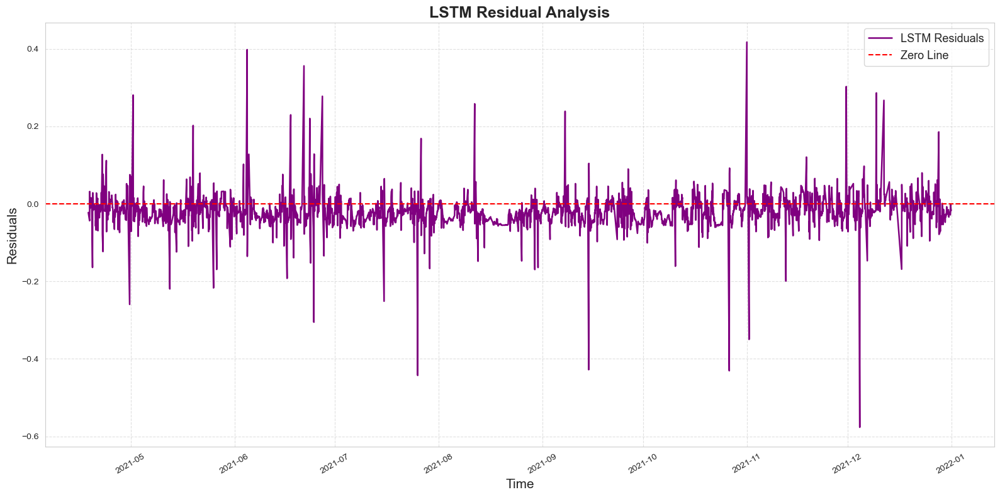

LSTM Residual Analysis:
Mean of Residuals: -0.020209766564520212
Standard Deviation of Residuals: 0.03455820070492642


In [65]:
# LSTM residual analysis plot and statistics
# Calculate residuals for LSTM model
residuals_LSTM = y_test_LSTM.flatten() - test_predict_LSTM.flatten()

# Use real timestamps for x-axis
x_test_ticks_LSTM = univariate_df.tail(len(y_test_LSTM))['ds']

plt.figure(figsize=(16, 8))
plt.plot(x_test_ticks_LSTM, residuals_LSTM, label='LSTM Residuals', color='purple', linewidth=1.8)
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('LSTM Residual Analysis', fontsize=18, fontweight='bold')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Residuals', fontsize=15)
plt.legend(fontsize=13)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

# Print residual statistics
print("LSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_LSTM))
print("Standard Deviation of Residuals:", np.std(residuals_LSTM))

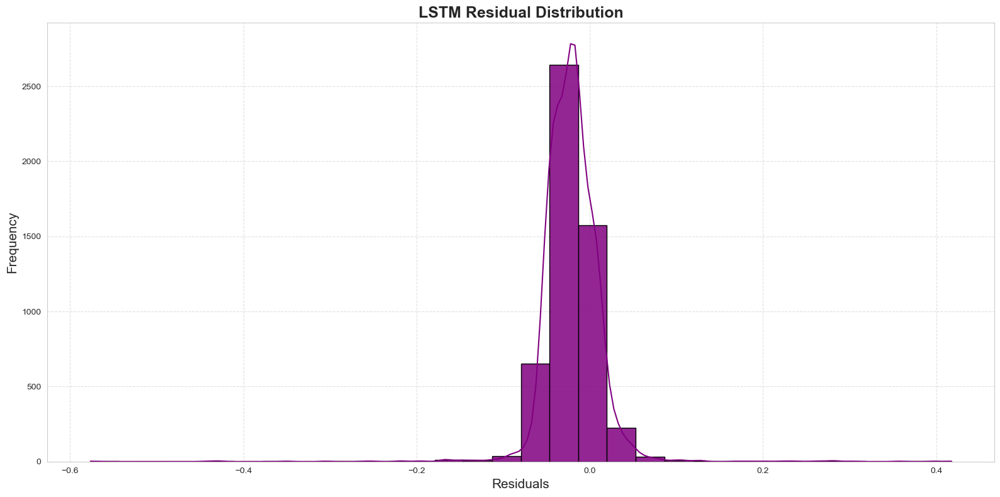

LSTM Residual Distribution Analysis:
Mean of Residuals: -0.020209766564520212
Standard Deviation of Residuals: 0.03455820070492642


In [66]:
# Plot the distribution of LSTM residuals (error histogram with KDE)
plt.figure(figsize=(16, 8))
sns.set_style('whitegrid')
sns.histplot(residuals_LSTM, bins=30, kde=True, color='purple', edgecolor='black', alpha=0.85)
plt.title('LSTM Residual Distribution', fontsize=18, fontweight='bold')
plt.xlabel('Residuals', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Print residual distribution statistics for LSTM
print("LSTM Residual Distribution Analysis:")
print("Mean of Residuals:", np.mean(residuals_LSTM))
print("Standard Deviation of Residuals:", np.std(residuals_LSTM))

In [67]:
print("训练集长度:", len(y_train))  # 应为 29752
print("测试集长度:", len(x_train))   # 应为 len(univariate_df) - 29752

训练集长度: 24535
测试集长度: 24535


# **Building and Compiling BiLSTM model**

In [131]:
# Build and train BiLSTM model for wind power prediction
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Bidirectional, LSTM, Dense
from tensorflow.keras.optimizers import Adam

# Build BiLSTM model
model_BiLSTM = Sequential(name="BiLSTM_Model")
model_BiLSTM.add(Bidirectional(
    LSTM(128, return_sequences=True),
    input_shape=(x_train.shape[1], x_train.shape[2])
))
model_BiLSTM.add(Bidirectional(
    LSTM(64, return_sequences=False)
))
model_BiLSTM.add(Dense(25, activation='relu'))
model_BiLSTM.add(Dense(1))

# Compile model
model_BiLSTM.compile(optimizer=Adam(learning_rate=1e-3), loss='mean_squared_error', metrics=['mae'])

# Train model
history_BiLSTM = model_BiLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
767/767 [==============================] - 13s 11ms/step - loss: 0.0113 - mae: 0.0620 - val_loss: 0.0030 - val_mae: 0.0419
Epoch 2/80
767/767 [==============================] - 7s 9ms/step - loss: 0.0026 - mae: 0.0309 - val_loss: 0.0016 - val_mae: 0.0228
Epoch 3/80
767/767 [==============================] - 7s 9ms/step - loss: 0.0023 - mae: 0.0289 - val_loss: 0.0016 - val_mae: 0.0252
Epoch 4/80
767/767 [==============================] - 8s 10ms/step - loss: 0.0022 - mae: 0.0275 - val_loss: 0.0014 - val_mae: 0.0231
Epoch 5/80
767/767 [==============================] - 7s 10ms/step - loss: 0.0021 - mae: 0.0270 - val_loss: 0.0015 - val_mae: 0.0235
Epoch 6/80
767/767 [==============================] - 7s 9ms/step - loss: 0.0021 - mae: 0.0261 - val_loss: 0.0016 - val_mae: 0.0244
Epoch 7/80
767/767 [==============================] - 6s 8ms/step - loss: 0.0020 - mae: 0.0252 - val_loss: 0.0018 - val_mae: 0.0308
Epoch 8/80
767/767 [==============================] - 6s 7ms/step - loss

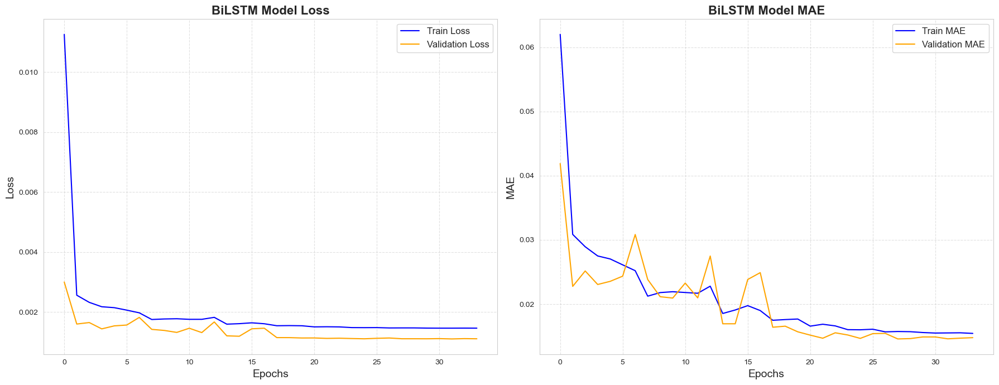

In [133]:
# Plot training and validation loss and MAE
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
axes[0].plot(history_BiLSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_BiLSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('BiLSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_BiLSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_BiLSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('BiLSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [134]:
# Display model summary
model_BiLSTM.summary()

Model: "BiLSTM_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional (Bidirectional (None, 1, 256)            185344    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 128)               164352    
_________________________________________________________________
dense_4 (Dense)              (None, 25)                3225      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 26        
Total params: 352,947
Trainable params: 352,947
Non-trainable params: 0
_________________________________________________________________


In [135]:
# Save  the best BiLSTM model
model_BiLSTM.save('model/best_model_bilstm.h5')

In [68]:
# Load the best BiLSTM model
best_model_BiLSTM = load_model('model/best_model_bilstm.h5')

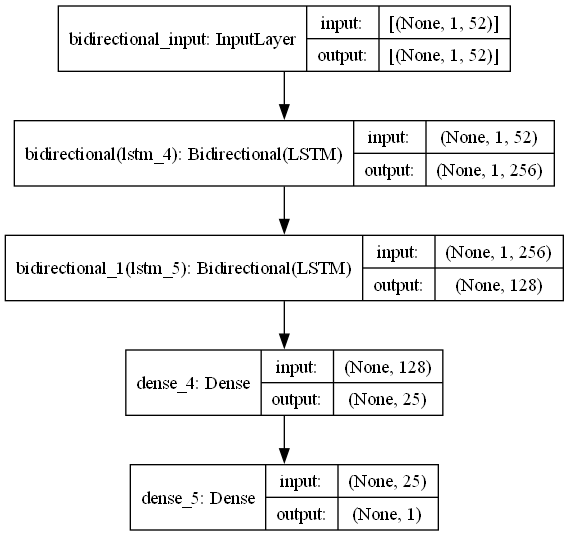

In [69]:
# Visualize the model structure
plot_model(best_model_BiLSTM, to_file='model_structure/model_bilstm.png', show_shapes=True, show_layer_names=True)

# Display the model architecture
Image(filename='model_structure/model_bilstm.png')

# **Predictions and Evaluation BiLSTM**

In [70]:
# Predict using BiLSTM model
train_predict_BiLSTM = best_model_BiLSTM.predict(x_train)
test_predict_BiLSTM = best_model_BiLSTM.predict(x_test)

# Inverse transform predictions and true values
train_predict_BiLSTM = scaler.inverse_transform(train_predict_BiLSTM)
y_train_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_BiLSTM = scaler.inverse_transform(test_predict_BiLSTM)
y_test_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate evaluation metrics
score_rmse_BiLSTM = np.sqrt(mean_squared_error(y_test_BiLSTM, test_predict_BiLSTM))
score_mae_BiLSTM = mean_absolute_error(y_test_BiLSTM, test_predict_BiLSTM)
print(Fore.GREEN + 'BiLSTM Model RMSE: {:.4f}'.format(score_rmse_BiLSTM))
print(Fore.BLUE + 'BiLSTM Model MAE: {:.4f}'.format(score_mae_BiLSTM))

BiLSTM Model RMSE: 0.0302
BiLSTM Model MAE: 0.0137


# **Plot BiLSTM Model**

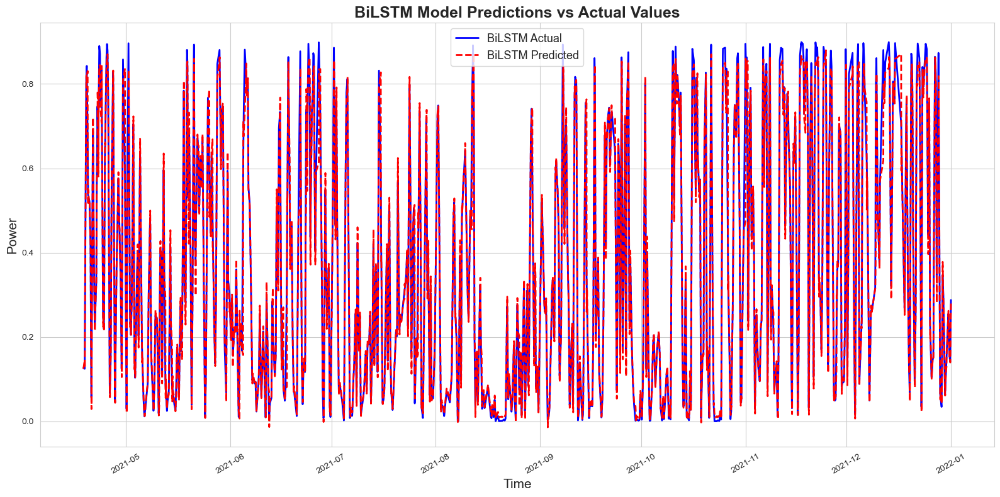

In [71]:
# Plot BiLSTM predictions vs actual values
x_test_ticks_BiLSTM = univariate_df.tail(len(y_test_BiLSTM))['ds']
plt.figure(figsize=(16, 8))
sns.set_style('whitegrid')
plt.plot(x_test_ticks_BiLSTM, y_test_BiLSTM.flatten(), label='BiLSTM Actual', color='blue', linewidth=2)
plt.plot(x_test_ticks_BiLSTM, test_predict_BiLSTM.flatten(), label='BiLSTM Predicted', color='red', linewidth=2, linestyle='--')
plt.title('BiLSTM Model Predictions vs Actual Values', fontsize=18, fontweight='bold')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Power', fontsize=15)
plt.legend(fontsize=13)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

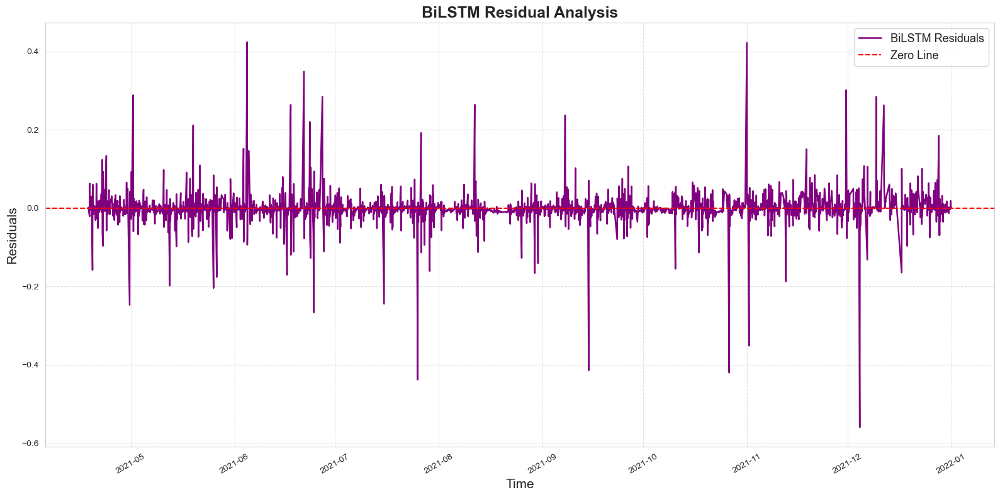

BiLSTM Residual Analysis:
Mean of Residuals: -0.00040168562953457745
Standard Deviation of Residuals: 0.030169516333549553


In [74]:
# Residual analysis plot and statistics
residuals_BiLSTM = y_test_BiLSTM.flatten() - test_predict_BiLSTM.flatten()
plt.figure(figsize=(16, 8))
plt.plot(x_test_ticks_BiLSTM, residuals_BiLSTM, label='BiLSTM Residuals', color='purple', linewidth=1.8)
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('BiLSTM Residual Analysis', fontsize=18, fontweight='bold')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Residuals', fontsize=15)
plt.legend(fontsize=13)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()
print("BiLSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_BiLSTM))
print("Standard Deviation of Residuals:", np.std(residuals_BiLSTM))

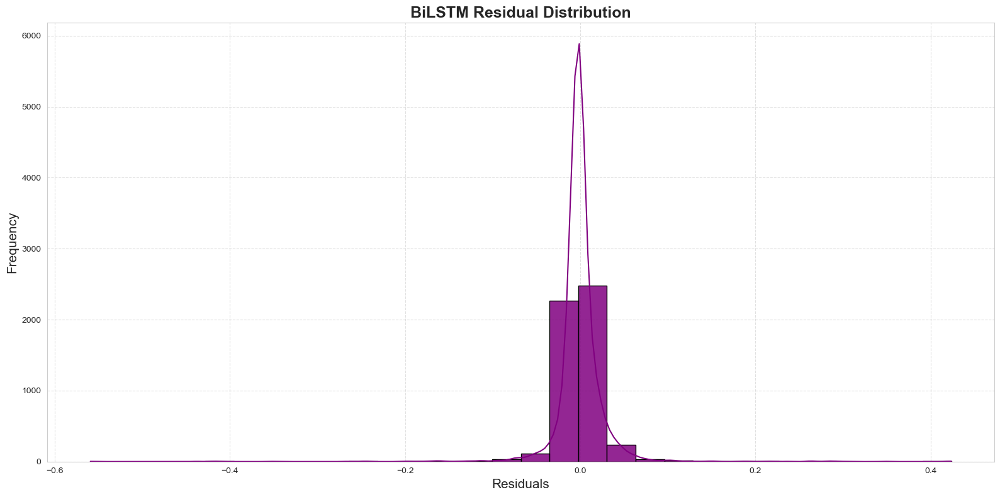

BiLSTM Residual Distribution Analysis:
Mean of Residuals: -0.00040168562953457745
Standard Deviation of Residuals: 0.030169516333549553


In [75]:
# Residual distribution plot
plt.figure(figsize=(16, 8))
sns.set_style('whitegrid')
sns.histplot(residuals_BiLSTM, bins=30, kde=True, color='purple', edgecolor='black', alpha=0.85)
plt.title('BiLSTM Residual Distribution', fontsize=18, fontweight='bold')
plt.xlabel('Residuals', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()
print("BiLSTM Residual Distribution Analysis:")
print("Mean of Residuals:", np.mean(residuals_BiLSTM))
print("Standard Deviation of Residuals:", np.std(residuals_BiLSTM))

# **Building and Compiling Transform+LSTM model**

In [79]:
#  Define Transformer block for the model
class TransformerBlock(Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1, **kwargs):
        super(TransformerBlock, self).__init__(**kwargs)
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.ff_dim = ff_dim
        self.rate = rate

        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = tf.keras.Sequential([
            Dense(ff_dim, activation="relu"),
            Dense(embed_dim)
        ])
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout1 = Dropout(rate)
        self.dropout2 = Dropout(rate)

    def call(self, inputs, training=False):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

    def get_config(self):
        config = super(TransformerBlock, self).get_config()
        config.update({
            "embed_dim": self.embed_dim,
            "num_heads": self.num_heads,
            "ff_dim": self.ff_dim,
            "rate": self.rate,
        })
        return config

# Build Transformer + LSTM model
def build_transformer_lstm(input_shape, embed_dim=64, num_heads=4, ff_dim=256, lstm_units=128):
    model = Sequential(name="Transformer_LSTM")
    
    # Transformer block
    model.add(tf.keras.layers.Dense(embed_dim, input_shape=input_shape))  # Mapping input to embedding dimension
    model.add(TransformerBlock(embed_dim=embed_dim, num_heads=num_heads, ff_dim=ff_dim))
    
    # LSTM layers
    model.add(LSTM(lstm_units, return_sequences=True))  
    model.add(LSTM(lstm_units//2, return_sequences=False))  
    
    # Fully connected layers
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    
    # Output layer
    model.add(Dense(1))  
    
    return model


In [84]:
# Define model parameters
embed_dim = 64    # Transformer 嵌入维度
num_heads = 4     # 注意力头数
ff_dim = 256       # 前馈网络维度
lstm_units = 128   # LSTM隐藏单元数

# ===================== 模型初始化与训练 =====================
# 初始化模型
model_TransformLSTM = build_transformer_lstm(
    input_shape=(x_train.shape[1], x_train.shape[2]),embed_dim=embed_dim, num_heads=num_heads, ff_dim=ff_dim, lstm_units=lstm_units
)

# 编译模型
model_TransformLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)

# 训练模型
history_TransformLSTM = model_TransformLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
767/767 [==============================] - 11s 11ms/step - loss: 0.0204 - mae: 0.1021 - val_loss: 0.0022 - val_mae: 0.0311
Epoch 2/80
767/767 [==============================] - 8s 10ms/step - loss: 0.0085 - mae: 0.0689 - val_loss: 0.0028 - val_mae: 0.0399
Epoch 3/80
767/767 [==============================] - 7s 10ms/step - loss: 0.0065 - mae: 0.0596 - val_loss: 0.0029 - val_mae: 0.0391
Epoch 4/80
767/767 [==============================] - 8s 10ms/step - loss: 0.0052 - mae: 0.0519 - val_loss: 0.0019 - val_mae: 0.0275
Epoch 5/80
767/767 [==============================] - 9s 12ms/step - loss: 0.0047 - mae: 0.0487 - val_loss: 0.0027 - val_mae: 0.0408
Epoch 6/80
767/767 [==============================] - 9s 12ms/step - loss: 0.0042 - mae: 0.0451 - val_loss: 0.0015 - val_mae: 0.0234
Epoch 7/80
767/767 [==============================] - 9s 11ms/step - loss: 0.0040 - mae: 0.0440 - val_loss: 0.0015 - val_mae: 0.0222
Epoch 8/80
767/767 [==============================] - 9s 12ms/step -

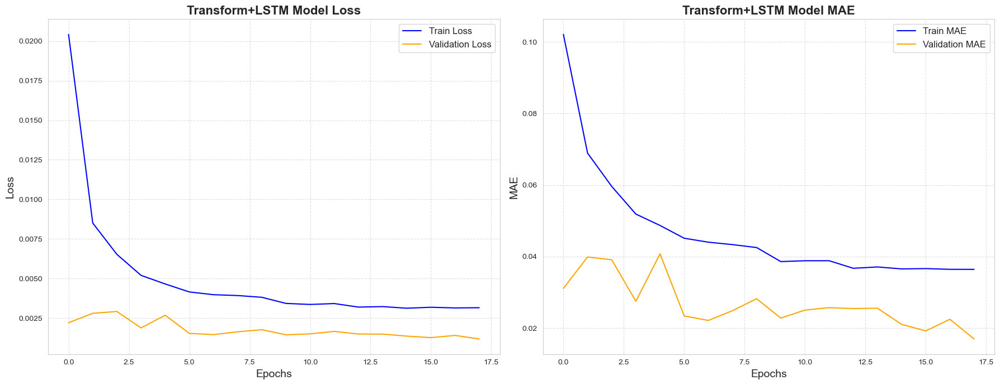

In [85]:
# Plot training and validation loss and MAE for Transform+LSTM
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
axes[0].plot(history_TransformLSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_TransformLSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('Transform+LSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_TransformLSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_TransformLSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('Transform+LSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [86]:
# Display model summary
model_TransformLSTM.summary()

Model: "Transformer_LSTM"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 1, 64)             3392      
_________________________________________________________________
transformer_block (Transform (None, 1, 64)             99712     
_________________________________________________________________
lstm_4 (LSTM)                (None, 1, 128)            98816     
_________________________________________________________________
lstm_5 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense_7 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_6 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 1)            

In [87]:
# Save the best Transform+LSTM model
model_TransformLSTM.save('model/best_model_transformer_lstm.h5')

In [88]:
# Load the best Transform+LSTM model
best_model_TransformLSTM = load_model('model/best_model_transformer_lstm.h5', custom_objects={'TransformerBlock': TransformerBlock})

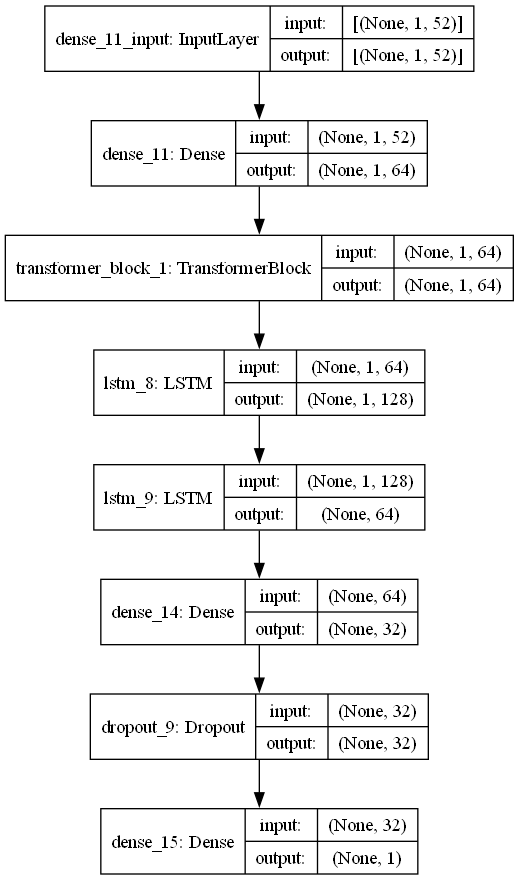

In [156]:
# Visualize the model structure
plot_model(model_TransformLSTM, to_file='model_structure/model_transformer_lstm.png', show_shapes=True, show_layer_names=True)
Image(filename='model_structure/model_transformer_lstm.png')

# **Predictions and Evaluation Transform+LSTM**

In [89]:
# Predictions and evaluation for Transform+LSTM
train_predict_TransformLSTM = best_model_TransformLSTM.predict(x_train)
test_predict_TransformLSTM = best_model_TransformLSTM.predict(x_test)

# Inverse transform predictions and true values
train_predict_TransformLSTM = scaler.inverse_transform(train_predict_TransformLSTM)
y_train_TransformLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_TransformLSTM = scaler.inverse_transform(test_predict_TransformLSTM)
y_test_TransformLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate evaluation metrics
score_rmse_TransformLSTM = np.sqrt(mean_squared_error(y_test_TransformLSTM, test_predict_TransformLSTM))
score_mae_TransformLSTM = mean_absolute_error(y_test_TransformLSTM, test_predict_TransformLSTM)
print(Fore.GREEN + 'Transform+LSTM Model RMSE: {:.4f}'.format(score_rmse_TransformLSTM))
print(Fore.BLUE + 'Transform+LSTM Model MAE: {:.4f}'.format(score_mae_TransformLSTM))

Transform+LSTM Model RMSE: 0.0348
Transform+LSTM Model MAE: 0.0229


# **Plot Transform+LSTM Model**

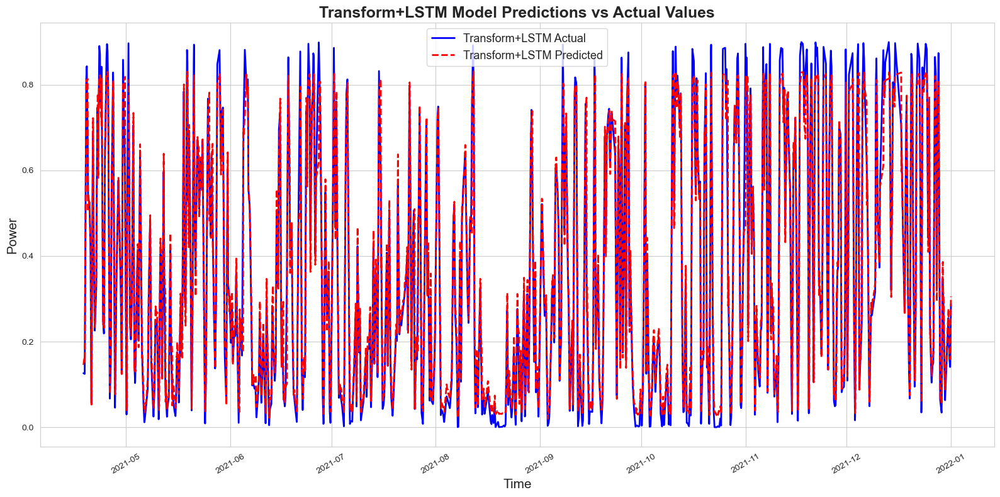

In [90]:
# Plot predictions vs actual values
x_test_ticks_TransformLSTM = univariate_df.tail(len(y_test_TransformLSTM))['ds']
plt.figure(figsize=(16, 8))
sns.set_style('whitegrid')
plt.plot(x_test_ticks_TransformLSTM, y_test_TransformLSTM.flatten(), label='Transform+LSTM Actual', color='blue', linewidth=2)
plt.plot(x_test_ticks_TransformLSTM, test_predict_TransformLSTM.flatten(), label='Transform+LSTM Predicted', color='red', linewidth=2, linestyle='--')
plt.title('Transform+LSTM Model Predictions vs Actual Values', fontsize=18, fontweight='bold')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Power', fontsize=15)
plt.legend(fontsize=13)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

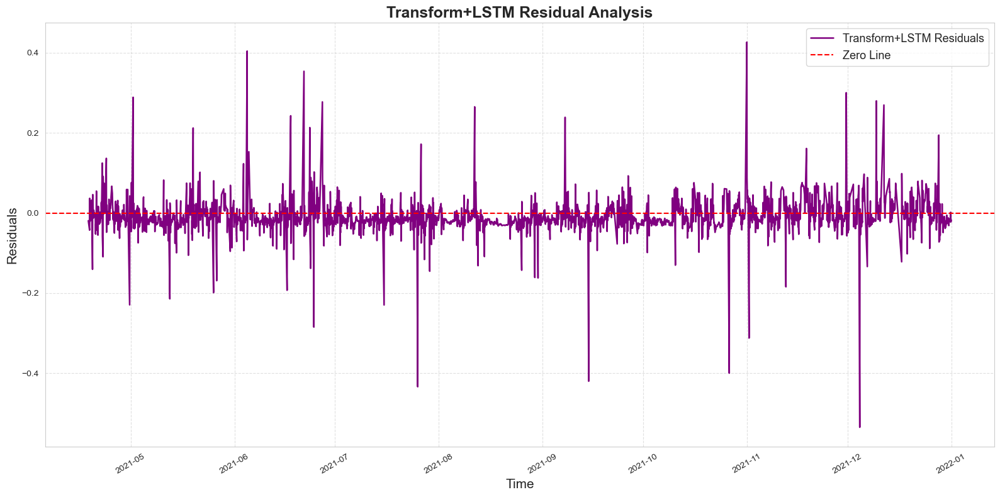

Transform+LSTM Residual Analysis:
Mean of Residuals: -0.009497593016309066
Standard Deviation of Residuals: 0.0334786212900744


In [91]:
# Residual analysis plot and statistics
residuals_TransformLSTM = y_test_TransformLSTM.flatten() - test_predict_TransformLSTM.flatten()
plt.figure(figsize=(16, 8))
plt.plot(x_test_ticks_TransformLSTM, residuals_TransformLSTM, label='Transform+LSTM Residuals', color='purple', linewidth=1.8)
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('Transform+LSTM Residual Analysis', fontsize=18, fontweight='bold')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Residuals', fontsize=15)
plt.legend(fontsize=13)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()
print("Transform+LSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_TransformLSTM))
print("Standard Deviation of Residuals:", np.std(residuals_TransformLSTM))

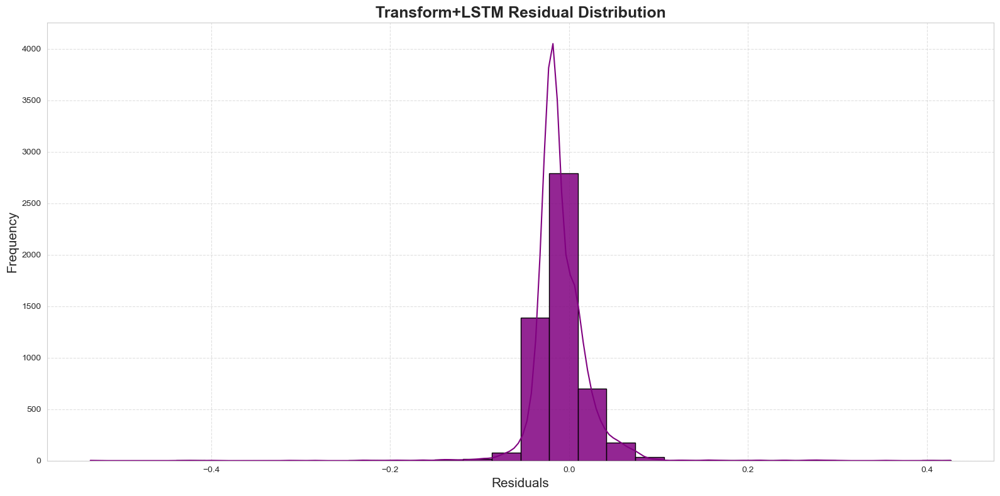

Transform+LSTM Residual Distribution Analysis:
Mean of Residuals: -0.009497593016309066
Standard Deviation of Residuals: 0.0334786212900744


In [92]:
# Residual distribution plot
plt.figure(figsize=(16, 8))
sns.set_style('whitegrid')
sns.histplot(residuals_TransformLSTM, bins=30, kde=True, color='purple', edgecolor='black', alpha=0.85)
plt.title('Transform+LSTM Residual Distribution', fontsize=18, fontweight='bold')
plt.xlabel('Residuals', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()
print("Transform+LSTM Residual Distribution Analysis:")
print("Mean of Residuals:", np.mean(residuals_TransformLSTM))
print("Standard Deviation of Residuals:", np.std(residuals_TransformLSTM))

# **Building and Compiling Transform+BiLSTM model**

In [161]:
# ===================== Build Transformer + BiLSTM Model =====================
def build_transformer_bilstm(input_shape, embed_dim=64, num_heads=4, ff_dim=256, lstm_units=128):
    model = Sequential(name="Transformer_BiLSTM")
    # Transformer encoder part
    model.add(tf.keras.layers.Dense(embed_dim, input_shape=input_shape))
    model.add(TransformerBlock(embed_dim=embed_dim, num_heads=num_heads, ff_dim=ff_dim))
    # BiLSTM temporal modeling
    model.add(Bidirectional(LSTM(lstm_units, return_sequences=True)))
    model.add(Bidirectional(LSTM(lstm_units // 2, return_sequences=False)))
    # Fully connected layer
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    # Output layer
    model.add(Dense(1))
    return model

# ===================== Model Initialization and Compilation =====================
embed_dim = 64
num_heads = 4
ff_dim = 256
lstm_units = 128

model_TransformBiLSTM = build_transformer_bilstm(
    input_shape=(x_train.shape[1], x_train.shape[2]),
    embed_dim=embed_dim, num_heads=num_heads, ff_dim=ff_dim, lstm_units=lstm_units
)

model_TransformBiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)

# ===================== Model Training =====================
history_TransformBiLSTM = model_TransformBiLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
767/767 [==============================] - 16s 17ms/step - loss: 0.0196 - mae: 0.1030 - val_loss: 0.0048 - val_mae: 0.0518
Epoch 2/80
767/767 [==============================] - 14s 18ms/step - loss: 0.0087 - mae: 0.0697 - val_loss: 0.0030 - val_mae: 0.0412
Epoch 3/80
767/767 [==============================] - 13s 17ms/step - loss: 0.0064 - mae: 0.0589 - val_loss: 0.0017 - val_mae: 0.0260
Epoch 4/80
767/767 [==============================] - 13s 17ms/step - loss: 0.0053 - mae: 0.0529 - val_loss: 0.0020 - val_mae: 0.0312
Epoch 5/80
767/767 [==============================] - 10s 13ms/step - loss: 0.0045 - mae: 0.0476 - val_loss: 0.0018 - val_mae: 0.0284
Epoch 6/80
767/767 [==============================] - 11s 14ms/step - loss: 0.0042 - mae: 0.0458 - val_loss: 0.0024 - val_mae: 0.0324
Epoch 7/80
767/767 [==============================] - 10s 13ms/step - loss: 0.0037 - mae: 0.0409 - val_loss: 0.0016 - val_mae: 0.0250
Epoch 8/80
767/767 [==============================] - 11s 15ms

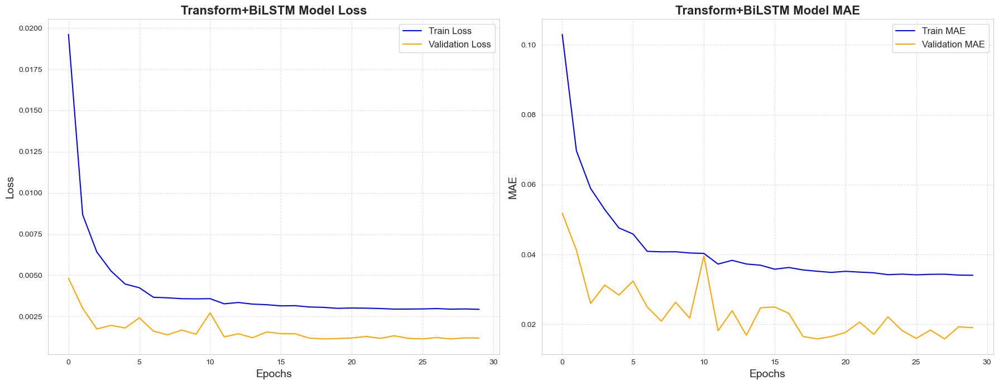

In [162]:
# ===================== Plot Training and Validation Curves =====================
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
axes[0].plot(history_TransformBiLSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_TransformBiLSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('Transform+BiLSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_TransformBiLSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_TransformBiLSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('Transform+BiLSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [163]:
# Display model summary
model_TransformBiLSTM.summary()

Model: "Transformer_BiLSTM"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 1, 64)             3392      
_________________________________________________________________
transformer_block_2 (Transfo (None, 1, 64)             99712     
_________________________________________________________________
bidirectional_2 (Bidirection (None, 1, 256)            197632    
_________________________________________________________________
bidirectional_3 (Bidirection (None, 128)               164352    
_________________________________________________________________
dense_21 (Dense)             (None, 32)                4128      
_________________________________________________________________
dropout_14 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_22 (Dense)             (None, 1)          

In [174]:
# Save the best Transform+BiLSTM model
model_TransformBiLSTM.save('model/best_model_transformer_bilstm.h5')

In [93]:
# Load the best Transform+BiLSTM model
best_model_TransformBiLSTM = load_model('model/best_model_transformer_bilstm.h5', custom_objects={'TransformerBlock': TransformerBlock})

In [ ]:
# ===================== Model Structure Visualization =====================
plot_model(model_TransformBiLSTM, to_file='model_structure/model_transformer_bilstm.png', show_shapes=True, show_layer_names=True)

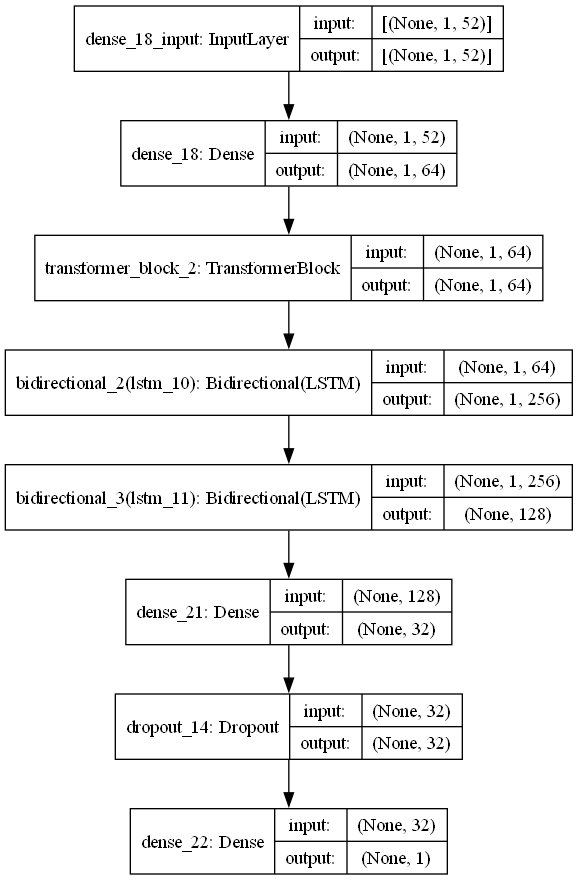

In [95]:
Image(filename='model_structure/model_transformer_bilstm.png')

# **Predictions and Evaluation Transform+BiLSTM**

In [96]:
# ===================== Predictions and Evaluation =====================
train_predict_TransformBiLSTM = best_model_TransformBiLSTM.predict(x_train)
test_predict_TransformBiLSTM = best_model_TransformBiLSTM.predict(x_test)
train_predict_TransformBiLSTM = scaler.inverse_transform(train_predict_TransformBiLSTM)
y_train_TransformBiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_TransformBiLSTM = scaler.inverse_transform(test_predict_TransformBiLSTM)
y_test_TransformBiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

score_rmse_TransformBiLSTM = np.sqrt(mean_squared_error(y_test_TransformBiLSTM, test_predict_TransformBiLSTM))
score_mae_TransformBiLSTM = mean_absolute_error(y_test_TransformBiLSTM, test_predict_TransformBiLSTM)
print(Fore.GREEN + 'Transform+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_TransformBiLSTM))
print(Fore.BLUE + 'Transform+BiLSTM Model MAE: {:.4f}'.format(score_mae_TransformBiLSTM))

Transform+BiLSTM Model RMSE: 0.0308
Transform+BiLSTM Model MAE: 0.0149


# **Plot Transform+BiLSTM Model**

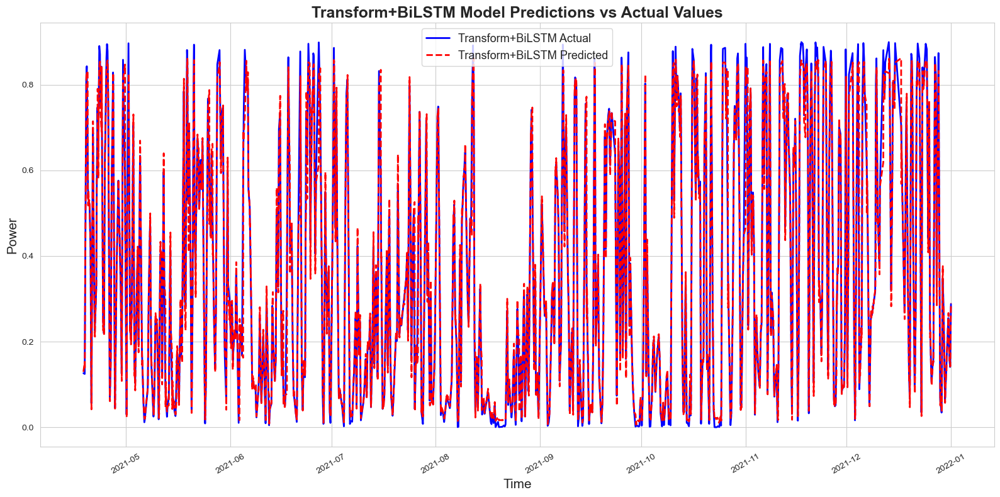

In [97]:
# ===================== Plot Predictions vs Actual =====================
x_test_ticks_TransformBiLSTM = univariate_df.tail(len(y_test_TransformBiLSTM))['ds']
plt.figure(figsize=(16, 8))
sns.set_style('whitegrid')
plt.plot(x_test_ticks_TransformBiLSTM, y_test_TransformBiLSTM.flatten(), label='Transform+BiLSTM Actual', color='blue', linewidth=2)
plt.plot(x_test_ticks_TransformBiLSTM, test_predict_TransformBiLSTM.flatten(), label='Transform+BiLSTM Predicted', color='red', linewidth=2, linestyle='--')
plt.title('Transform+BiLSTM Model Predictions vs Actual Values', fontsize=18, fontweight='bold')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Power', fontsize=15)
plt.legend(fontsize=13)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

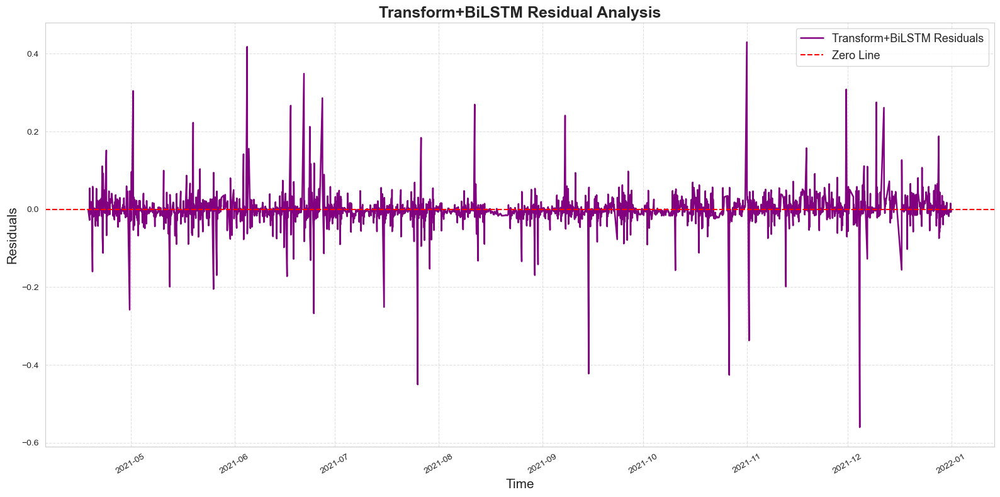

Transform+BiLSTM Residual Analysis:
Mean of Residuals: -0.000940029422047552
Standard Deviation of Residuals: 0.030816889221435263


In [98]:

# ===================== Residual Analysis =====================
residuals_TransformBiLSTM = y_test_TransformBiLSTM.flatten() - test_predict_TransformBiLSTM.flatten()
plt.figure(figsize=(16, 8))
plt.plot(x_test_ticks_TransformBiLSTM, residuals_TransformBiLSTM, label='Transform+BiLSTM Residuals', color='purple', linewidth=1.8)
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('Transform+BiLSTM Residual Analysis', fontsize=18, fontweight='bold')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Residuals', fontsize=15)
plt.legend(fontsize=13)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()
print("Transform+BiLSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_TransformBiLSTM))
print("Standard Deviation of Residuals:", np.std(residuals_TransformBiLSTM))


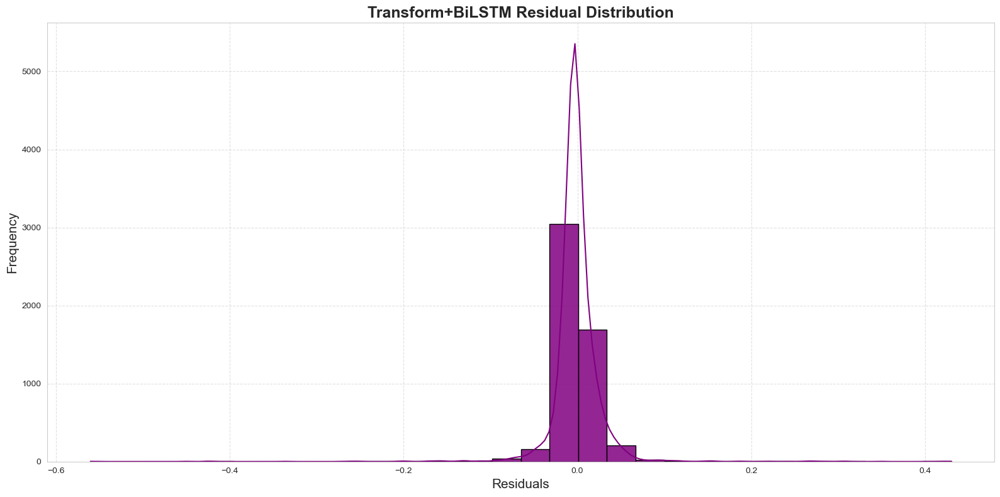

Transform+BiLSTM Residual Distribution Analysis:
Mean of Residuals: -0.000940029422047552
Standard Deviation of Residuals: 0.030816889221435263


In [99]:
# ===================== Residual Distribution Plot =====================
plt.figure(figsize=(16, 8))
sns.set_style('whitegrid')
sns.histplot(residuals_TransformBiLSTM, bins=30, kde=True, color='purple', edgecolor='black', alpha=0.85)
plt.title('Transform+BiLSTM Residual Distribution', fontsize=18, fontweight='bold')
plt.xlabel('Residuals', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()
print("Transform+BiLSTM Residual Distribution Analysis:")
print("Mean of Residuals:", np.mean(residuals_TransformBiLSTM))
print("Standard Deviation of Residuals:", np.std(residuals_TransformBiLSTM))

# **Build and compile CNN+Attension+LSTM+WaveletTransform**

In [104]:
import pywt
import numpy as np
from tensorflow.keras.layers import Input, Conv1D, GlobalAvgPool1D, Multiply, Add, Dense, Bidirectional, LSTM, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [105]:
# ===================== Wavelet Transform Function =====================
def wavelet_transform(data, wavelet='db4', level=3):
    """
    Perform wavelet decomposition on time series to generate multi-channel features.
    Args:
        data: Input array, shape [samples, timesteps, features]
        wavelet: Wavelet basis
        level: Decomposition level
    Returns:
        Concatenated coefficients, shape [samples, new_timesteps, features]
    """
    coeffs = pywt.wavedec(data, wavelet, level=level, axis=1)
    reconstructed = np.concatenate(coeffs, axis=1)
    return reconstructed

# Apply wavelet transform to training and test data
x_train_wavelet = wavelet_transform(x_train)
x_test_wavelet = wavelet_transform(x_test)

In [108]:
# ===================== Build CNN + Attention + BiLSTM + Wavelet Model =====================
def build_cnn_attention_wavelet_bilstm(input_shape, num_filters=64, lstm_units=128):
    """
    Build a hybrid model with multi-scale CNN, channel attention, and BiLSTM.
    Args:
        input_shape: Shape of input data (timesteps, features)
        num_filters: Number of filters for CNN layers
        lstm_units: Number of units for BiLSTM layers
    Returns:
        Keras Model
    """
    inputs = Input(shape=input_shape, name="Input_Wavelet")
    # Multi-scale CNN feature extraction
    conv1 = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(inputs)
    conv2 = Conv1D(filters=num_filters, kernel_size=5, padding='same', activation='relu')(inputs)
    conv3 = Conv1D(filters=num_filters, kernel_size=7, padding='same', activation='relu')(inputs)
    merged = Add()([conv1, conv2, conv3])
    # Channel attention mechanism
    gap = GlobalAvgPool1D()(merged)
    dense = Dense(num_filters // 2, activation='relu')(gap)
    attention = Dense(num_filters, activation='sigmoid')(dense)
    attention_weighted = Multiply()([merged, attention])
    # BiLSTM temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units, return_sequences=True))(attention_weighted)
    lstm_out = Bidirectional(LSTM(lstm_units // 2))(lstm_out)
    # Fully connected and output layer
    outputs = Dense(1)(lstm_out)
    model = Model(inputs=inputs, outputs=outputs, name="CNN_Attention_Wavelet_BiLSTM")
    return model

In [109]:
# ===================== Model Initialization and Compilation =====================
input_shape_wavelet = (x_train_wavelet.shape[1], x_train_wavelet.shape[2])
model_CNN_Atten_Wavelet_BiLSTM = build_cnn_attention_wavelet_bilstm(
    input_shape=input_shape_wavelet,
    num_filters=64,
    lstm_units=128
)
model_CNN_Atten_Wavelet_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)

# ===================== Model Training =====================
history_CNN_Atten_Wavelet_BiLSTM = model_CNN_Atten_Wavelet_BiLSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
767/767 [==============================] - 20s 17ms/step - loss: 0.0075 - mae: 0.0544 - val_loss: 0.0024 - val_mae: 0.0328
Epoch 2/80
767/767 [==============================] - 9s 12ms/step - loss: 0.0032 - mae: 0.0375 - val_loss: 0.0035 - val_mae: 0.0472
Epoch 3/80
767/767 [==============================] - 10s 13ms/step - loss: 0.0026 - mae: 0.0320 - val_loss: 0.0015 - val_mae: 0.0215
Epoch 4/80
767/767 [==============================] - 10s 13ms/step - loss: 0.0023 - mae: 0.0299 - val_loss: 0.0016 - val_mae: 0.0237
Epoch 5/80
767/767 [==============================] - 10s 14ms/step - loss: 0.0024 - mae: 0.0304 - val_loss: 0.0017 - val_mae: 0.0251
Epoch 6/80
767/767 [==============================] - 11s 14ms/step - loss: 0.0023 - mae: 0.0291 - val_loss: 0.0014 - val_mae: 0.0202
Epoch 7/80
767/767 [==============================] - 10s 13ms/step - loss: 0.0022 - mae: 0.0274 - val_loss: 0.0015 - val_mae: 0.0223
Epoch 8/80
767/767 [==============================] - 10s 13ms/

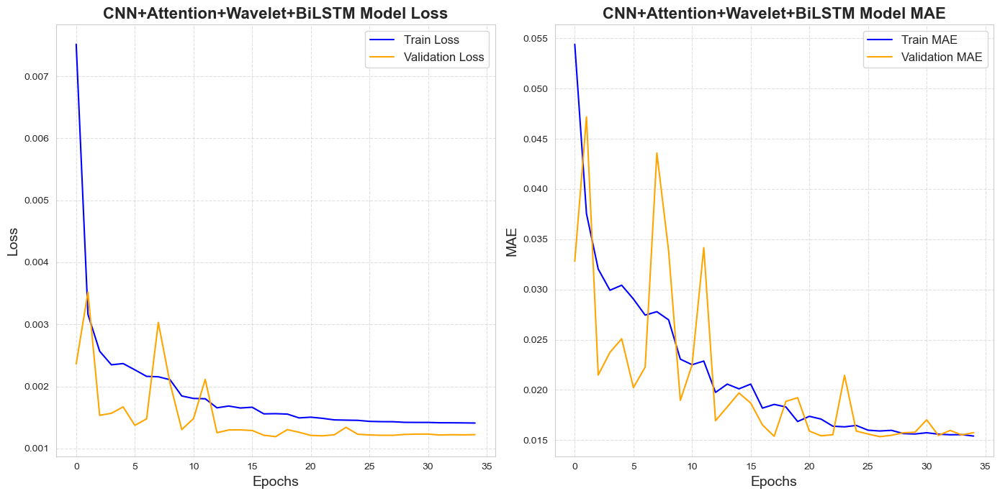

In [110]:
# Plot training and validation loss and MAE for CNN+Attention+Wavelet+BiLSTM
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].plot(history_CNN_Atten_Wavelet_BiLSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_CNN_Atten_Wavelet_BiLSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('CNN+Attention+Wavelet+BiLSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_CNN_Atten_Wavelet_BiLSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_CNN_Atten_Wavelet_BiLSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('CNN+Attention+Wavelet+BiLSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [20]:
# Display model summary
model_CNN_Atten_Wavelet_BiLSTM.summary()

Model: "CNN_Attention_Wavelet_BiLSTM"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_Wavelet (InputLayer)      [(None, 21, 52)]     0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 21, 64)       10048       Input_Wavelet[0][0]              
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 21, 64)       16704       Input_Wavelet[0][0]              
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 21, 64)       23360       Input_Wavelet[0][0]              
_______________________________________________________________________

In [113]:
# Save the best CNN+Attention+Wavelet+BiLSTM model
model_CNN_Atten_Wavelet_BiLSTM.save('model/best_model_cnn_atten_wavelet_bilstm.h5')

In [114]:
# Load the best CNN+Attention+Wavelet+BiLSTM model
best_model_CNN_Atten_Wavelet_BiLSTM = load_model('model/best_model_cnn_atten_wavelet_bilstm.h5', custom_objects={'TransformerBlock': TransformerBlock})

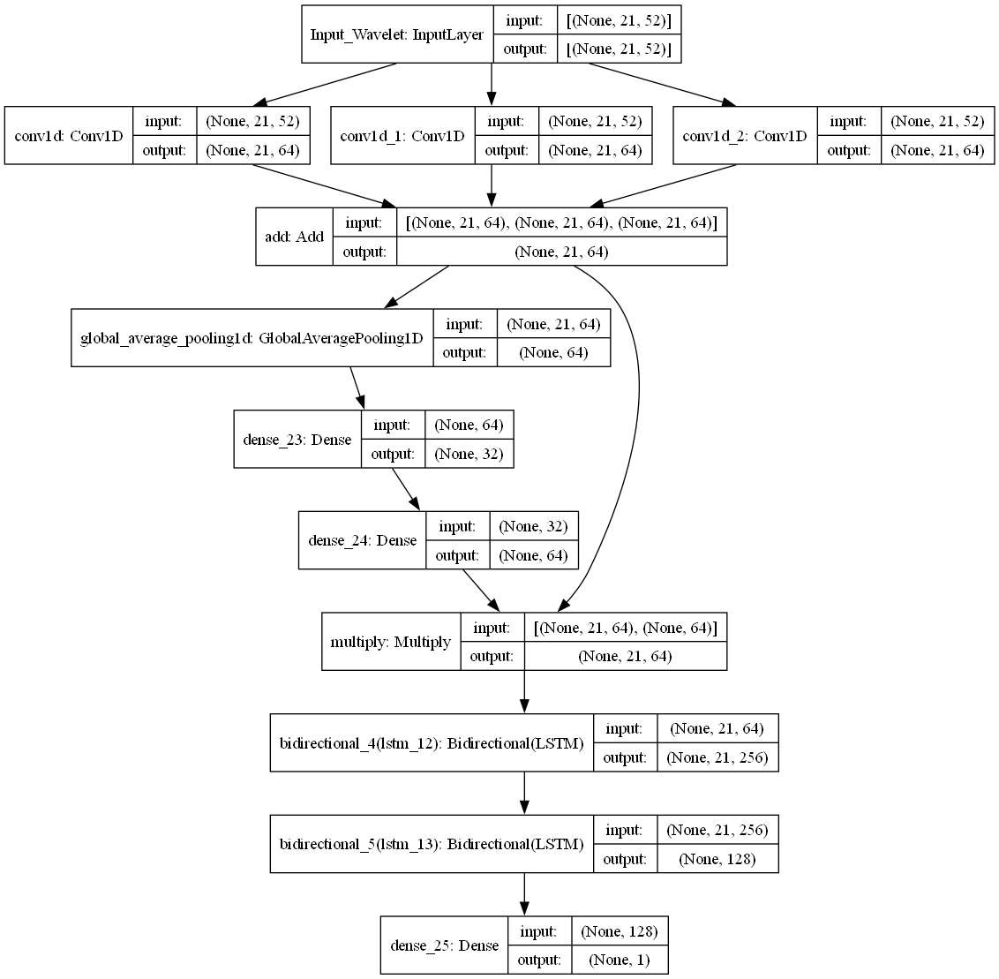

In [187]:
# Visualize the model structure
plot_model(model_CNN_Atten_Wavelet_BiLSTM, to_file='model_structure/model_cnn_atten_wavelet_bilstm.png', show_shapes=True, show_layer_names=True)

# Display the model architecture
Image(filename='model_structure/model_cnn_atten_wavelet_bilstm.png')

In [115]:
# Use the trained model to make predictions on train and test sets
train_predict_CNN_Atten_Wavelet_BiLSTM = best_model_CNN_Atten_Wavelet_BiLSTM.predict(x_train_wavelet)
test_predict_CNN_Atten_Wavelet_BiLSTM = best_model_CNN_Atten_Wavelet_BiLSTM.predict(x_test_wavelet)

# Inverse transform predictions and true values
train_predict_CNN_Atten_Wavelet_BiLSTM = scaler.inverse_transform(train_predict_CNN_Atten_Wavelet_BiLSTM)
y_train_CNN_Atten_Wavelet_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_CNN_Atten_Wavelet_BiLSTM = scaler.inverse_transform(test_predict_CNN_Atten_Wavelet_BiLSTM)
y_test_CNN_Atten_Wavelet_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate evaluation metrics (RMSE and MAE)
score_rmse_CNN_Atten_Wavelet_BiLSTM = np.sqrt(mean_squared_error(y_test_CNN_Atten_Wavelet_BiLSTM, test_predict_CNN_Atten_Wavelet_BiLSTM))
score_mae_CNN_Atten_Wavelet_BiLSTM = mean_absolute_error(y_test_CNN_Atten_Wavelet_BiLSTM, test_predict_CNN_Atten_Wavelet_BiLSTM)

# Print evaluation results
print(Fore.GREEN + 'CNN+Attention+Wavelet+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_CNN_Atten_Wavelet_BiLSTM))
print(Fore.BLUE + 'CNN+Attention+Wavelet+BiLSTM Model MAE: {:.4f}'.format(score_mae_CNN_Atten_Wavelet_BiLSTM))

CNN+Attention+Wavelet+BiLSTM Model RMSE: 0.0315
CNN+Attention+Wavelet+BiLSTM Model MAE: 0.0143


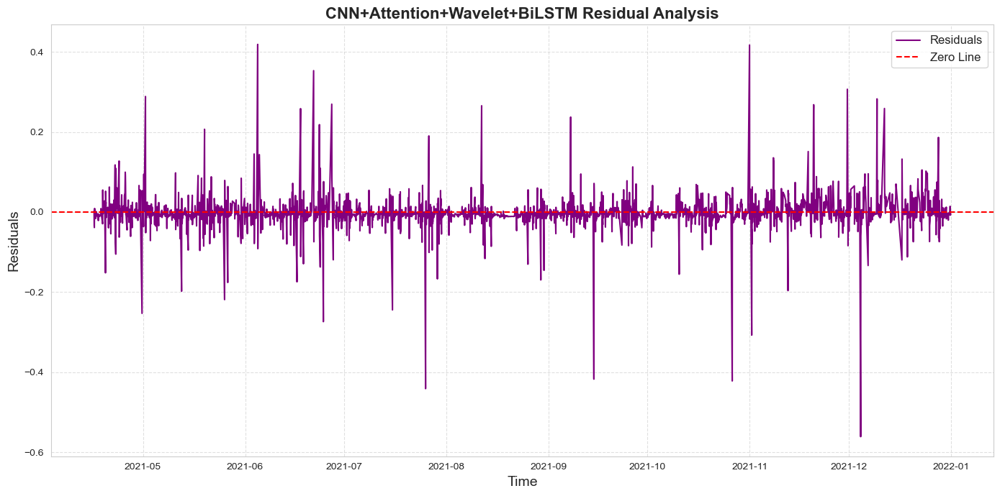

CNN+Attention+Wavelet+BiLSTM Residual Analysis:
Mean of Residuals: -0.002117283863053291
Standard Deviation of Residuals: 0.0317552159124274


In [192]:
# Residual analysis plot
residuals_CNN_Atten_Wavelet_BiLSTM = y_test_CNN_Atten_Wavelet_BiLSTM.flatten() - test_predict_CNN_Atten_Wavelet_BiLSTM.flatten()
x_test_ticks_CNN_Atten_Wavelet_BiLSTM = univariate_df.tail(len(y_test_CNN_Atten_Wavelet_BiLSTM))['ds']

plt.figure(figsize=(14, 7))
plt.plot(x_test_ticks_CNN_Atten_Wavelet_BiLSTM, residuals_CNN_Atten_Wavelet_BiLSTM, label='Residuals', color='purple')
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('CNN+Attention+Wavelet+BiLSTM Residual Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Print residual statistics
print("CNN+Attention+Wavelet+BiLSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_CNN_Atten_Wavelet_BiLSTM))
print("Standard Deviation of Residuals:", np.std(residuals_CNN_Atten_Wavelet_BiLSTM))

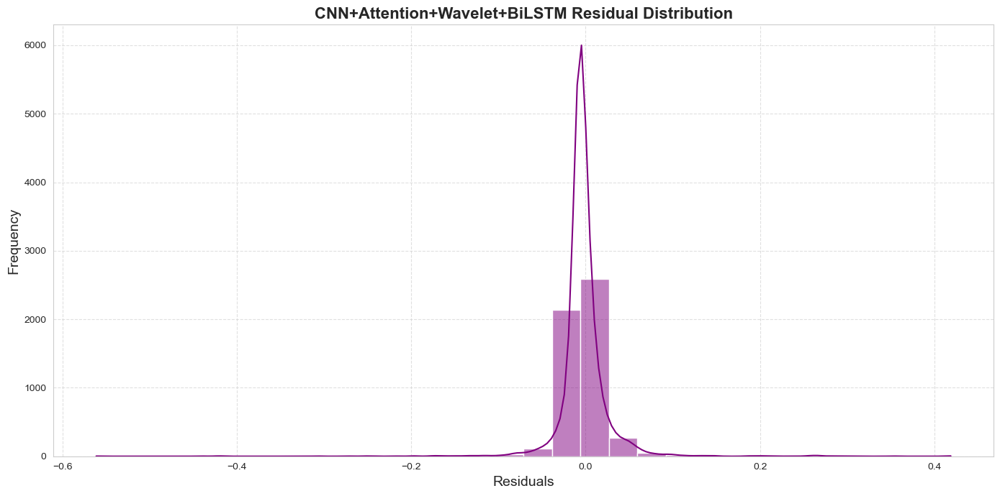

CNN+Attention+Wavelet+BiLSTM Residual Distribution Analysis:
Mean of Residuals: -0.002117283863053291
Standard Deviation of Residuals: 0.0317552159124274


In [193]:
# Residual distribution plot
plt.figure(figsize=(14, 7))
sns.histplot(residuals_CNN_Atten_Wavelet_BiLSTM, bins=30, kde=True, color='purple')
plt.title('CNN+Attention+Wavelet+BiLSTM Residual Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Residuals', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Print residual distribution statistics
print("CNN+Attention+Wavelet+BiLSTM Residual Distribution Analysis:")
print("Mean of Residuals:", np.mean(residuals_CNN_Atten_Wavelet_BiLSTM))
print("Standard Deviation of Residuals:", np.std(residuals_CNN_Atten_Wavelet_BiLSTM))

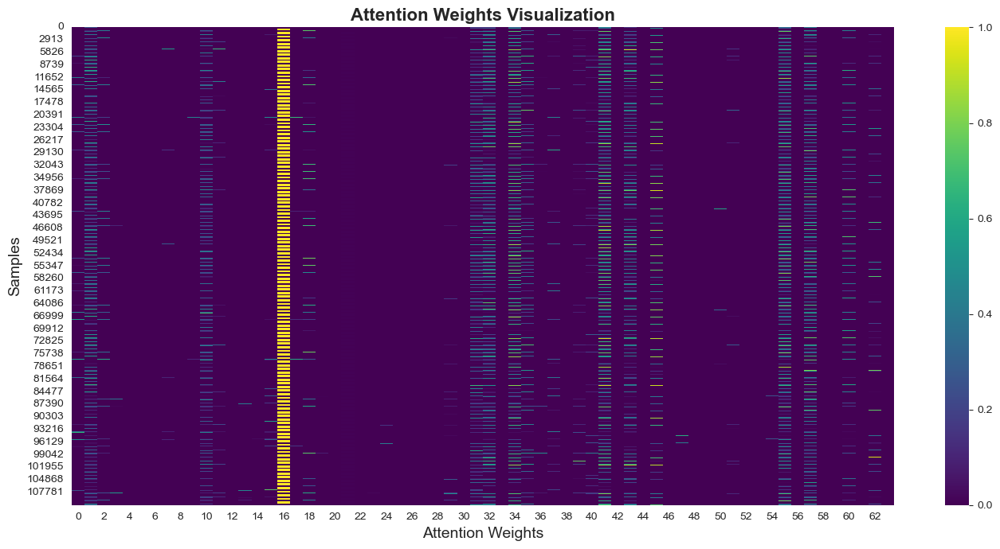

Attention Weights Analysis:
Mean of Attention Weights: 0.027838979
Standard Deviation of Attention Weights: 0.13112605


In [194]:
# Visualize attention weights from the CNN+Attention+Wavelet+BiLSTM model
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.cm as cm
from sklearn.preprocessing import MinMaxScaler
# Extract attention weights from the trained model
attention_weights = model_CNN_Atten_Wavelet_BiLSTM.layers[2].output
attention_weights = Model(inputs=model_CNN_Atten_Wavelet_BiLSTM.input, outputs=attention_weights)
attention_weights_output = attention_weights.predict(x_test_wavelet)
# Normalize attention weights for visualization
scaler = MinMaxScaler()
attention_weights_output = scaler.fit_transform(attention_weights_output.reshape(-1, attention_weights_output.shape[-1]))
# Visualize attention weights
plt.figure(figsize=(14, 7))
sns.heatmap(attention_weights_output, cmap='viridis', cbar=True)
plt.title('Attention Weights Visualization', fontsize=16, fontweight='bold')
plt.xlabel('Attention Weights', fontsize=14)
plt.ylabel('Samples', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Print attention weights statistics
print("Attention Weights Analysis:")
print("Mean of Attention Weights:", np.mean(attention_weights_output))
print("Standard Deviation of Attention Weights:", np.std(attention_weights_output))


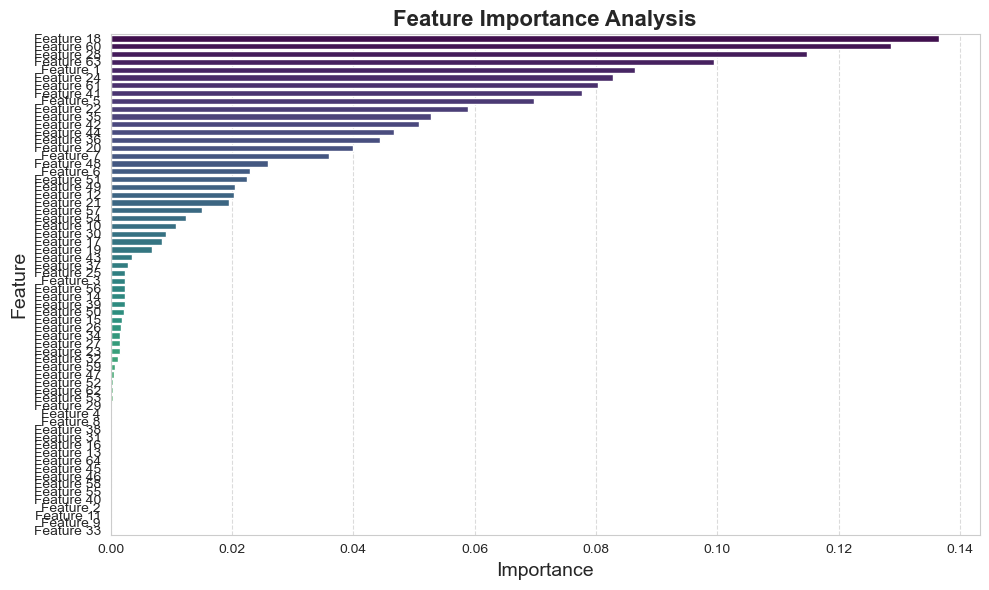

       Feature  Importance
17  Feature 18    0.136465
59  Feature 60    0.128700
27  Feature 28    0.114801
62  Feature 63    0.099491
0    Feature 1    0.086481
..         ...         ...
39  Feature 40    0.000000
1    Feature 2    0.000000
10  Feature 11    0.000000
8    Feature 9    0.000000
32  Feature 33    0.000000

[64 rows x 2 columns]


In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model

# Extract attention weights from the trained model
attention_layer = model_CNN_Atten_Wavelet_BiLSTM.layers[2].output
attention_model = Model(inputs=model_CNN_Atten_Wavelet_BiLSTM.input, outputs=attention_layer)
attention_weights = attention_model.predict(x_test_wavelet)

# Normalize attention weights
scaler = MinMaxScaler()
attention_weights_normalized = scaler.fit_transform(attention_weights.reshape(-1, attention_weights.shape[-1]))

# Calculate feature importance
feature_importance = np.mean(attention_weights_normalized, axis=0)

# Visualize feature importance
features = [f'Feature {i+1}' for i in range(len(feature_importance))]
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
plt.title('Feature Importance Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print(importance_df)


# **Evaluation Metrics**

In [114]:
# 打印结果（表格）
print(Fore.RED + 'Evaluation Metrics')
print("---"*20)

# LSTM Model
print(Fore.GREEN + 'LSTM Model')
print('RMSE:', score_rmse_LSTM)
print('MAE:', score_mae_LSTM)
print('Residual Mean:', np.mean(residuals_LSTM))
print('Residual Std Dev:', np.std(residuals_LSTM))
print("---"*20)

# BiLSTM Model
print(Fore.GREEN + 'BiLSTM Model')
print('RMSE:', score_rmse_BiLSTM)
print('MAE:', score_mae_BiLSTM)
print('Residual Mean:', np.mean(residuals_BiLSTM))
print('Residual Std Dev:', np.std(residuals_BiLSTM))
print("---"*20)

# Transformer + LSTM Model
print(Fore.GREEN + 'Transformer + LSTM Model')
print('RMSE:', score_rmse_TransformLSTM)
print('MAE:', score_mae_TransformLSTM)
print('Residual Mean:', np.mean(residuals_TransformLSTM))
print('Residual Std Dev:', np.std(residuals_TransformLSTM))
print("---"*20)

# Transformer + BiLSTM Model
print(Fore.GREEN + 'Transformer + BiLSTM Model')
print('RMSE:', score_rmse_TransformBiLSTM)
print('MAE:', score_mae_TransformBiLSTM)
print('Residual Mean:', np.mean(residuals_TransformBiLSTM))
print('Residual Std Dev:', np.std(residuals_TransformBiLSTM))
print("---"*20)

# CNN+Attention+Wavelet+BiLSTM Model
print(Fore.GREEN + 'CNN+Attention+Wavelet+BiLSTM Model')
print('RMSE:', score_rmse_CNN_Atten_Wavelet_BiLSTM)
print('MAE:', score_mae_CNN_Atten_Wavelet_BiLSTM)
print('Residual Mean:', np.mean(residuals_CNN_Atten_Wavelet_BiLSTM))
print('Residual Std Dev:', np.std(residuals_CNN_Atten_Wavelet_BiLSTM))
print("---"*20)
print("---"*20)

Evaluation Metrics
------------------------------------------------------------
LSTM Model
RMSE: 0.03321967485703246
MAE: 0.018480576809627332
Residual Mean: 9.755651007869037e-05
Residual Std Dev: 0.03321953160919485
------------------------------------------------------------
BiLSTM Model
RMSE: 0.033920618668531445
MAE: 0.01880949506430006
Residual Mean: 0.01030303282597965
Residual Std Dev: 0.032318042722954465
------------------------------------------------------------
Transformer + LSTM Model
RMSE: 0.03072089681175343
MAE: 0.014980105864926343
Residual Mean: 0.003423646680278427
Residual Std Dev: 0.030529529055113518
------------------------------------------------------------
Transformer + BiLSTM Model
RMSE: 0.031036721631111566
MAE: 0.014630045732404928
Residual Mean: 0.0007868371037778715
Residual Std Dev: 0.03102674615520015
------------------------------------------------------------
CNN+Attention+Wavelet+BiLSTM Model
RMSE: 0.030494384671248476
MAE: 0.013692973088163694
Resi

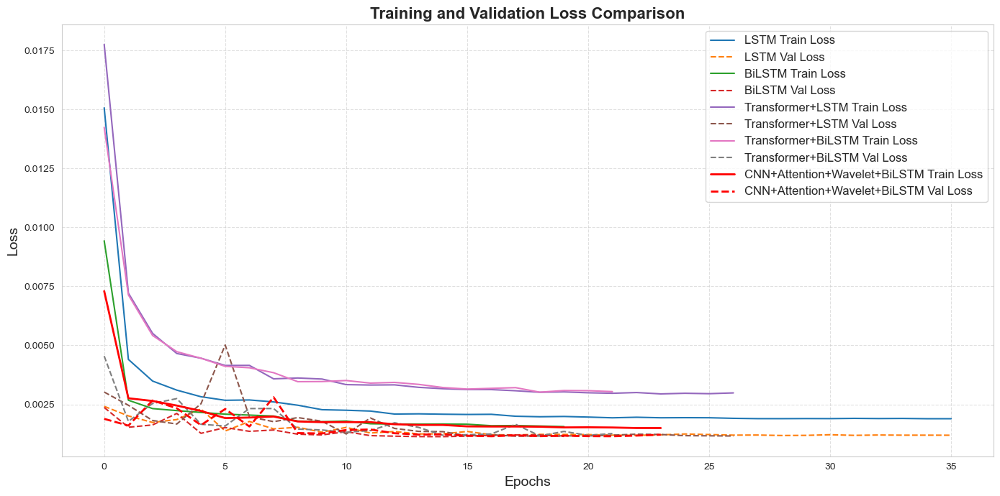

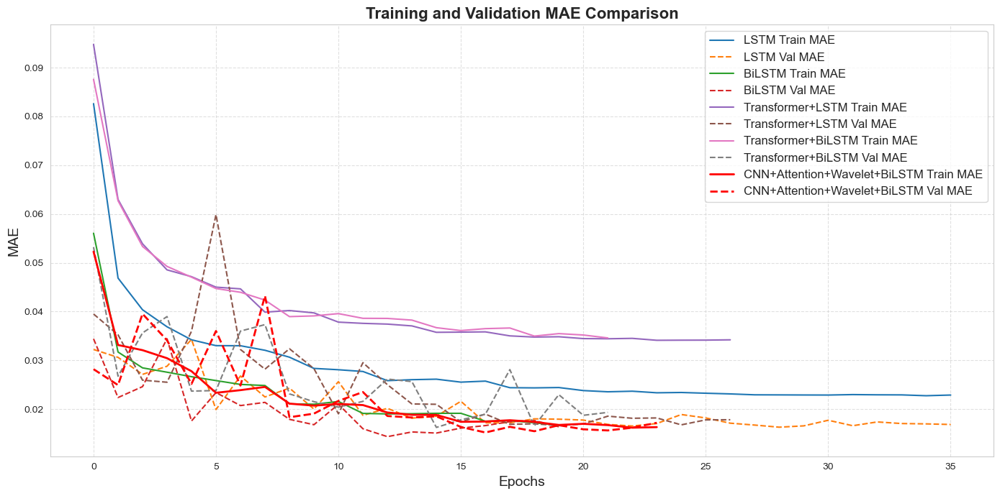

In [115]:
import matplotlib.pyplot as plt

# Model loss data
loss_data = {
    'LSTM': {'train': history_LSTM.history['loss'], 'val': history_LSTM.history['val_loss']},
    'BiLSTM': {'train': history_BiLSTM.history['loss'], 'val': history_BiLSTM.history['val_loss']},
    'Transformer+LSTM': {'train': history_TransformLSTM.history['loss'], 'val': history_TransformLSTM.history['val_loss']},
    'Transformer+BiLSTM': {'train': history_TransformBiLSTM.history['loss'], 'val': history_TransformBiLSTM.history['val_loss']},
    'CNN+Attention+Wavelet+BiLSTM': {'train': history_CNN_Atten_Wavelet_BiLSTM.history['loss'], 'val': history_CNN_Atten_Wavelet_BiLSTM.history['val_loss']}
}

# Model MAE data
mae_data = {
    'LSTM': {'train': history_LSTM.history['mae'], 'val': history_LSTM.history['val_mae']},
    'BiLSTM': {'train': history_BiLSTM.history['mae'], 'val': history_BiLSTM.history['val_mae']},
    'Transformer+LSTM': {'train': history_TransformLSTM.history['mae'], 'val': history_TransformLSTM.history['val_mae']},
    'Transformer+BiLSTM': {'train': history_TransformBiLSTM.history['mae'], 'val': history_TransformBiLSTM.history['val_mae']},
    'CNN+Attention+Wavelet+BiLSTM': {'train': history_CNN_Atten_Wavelet_BiLSTM.history['mae'], 'val': history_CNN_Atten_Wavelet_BiLSTM.history['val_mae']}
}

import matplotlib.pyplot as plt

# Highlight color for the hybrid model
highlight_color = 'red'
# Plot training and validation loss
plt.figure(figsize=(14, 7))
for model, data in loss_data.items():
    if model == 'CNN+Attention+Wavelet+BiLSTM':
        plt.plot(data['train'], label=f'{model} Train Loss', linestyle='-', color=highlight_color, linewidth=2)
        plt.plot(data['val'], label=f'{model} Val Loss', linestyle='--', color=highlight_color, linewidth=2)
    else:
        plt.plot(data['train'], label=f'{model} Train Loss', linestyle='-')
        plt.plot(data['val'], label=f'{model} Val Loss', linestyle='--')
plt.title('Training and Validation Loss Comparison', fontsize=16, fontweight='bold')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Plot training and validation MAE
plt.figure(figsize=(14, 7))
for model, data in mae_data.items():
    if model == 'CNN+Attention+Wavelet+BiLSTM':
        plt.plot(data['train'], label=f'{model} Train MAE', linestyle='-', color=highlight_color, linewidth=2)
        plt.plot(data['val'], label=f'{model} Val MAE', linestyle='--', color=highlight_color, linewidth=2)
    else:
        plt.plot(data['train'], label=f'{model} Train MAE', linestyle='-')
        plt.plot(data['val'], label=f'{model} Val MAE', linestyle='--')
plt.title('Training and Validation MAE Comparison', fontsize=16, fontweight='bold')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('MAE', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

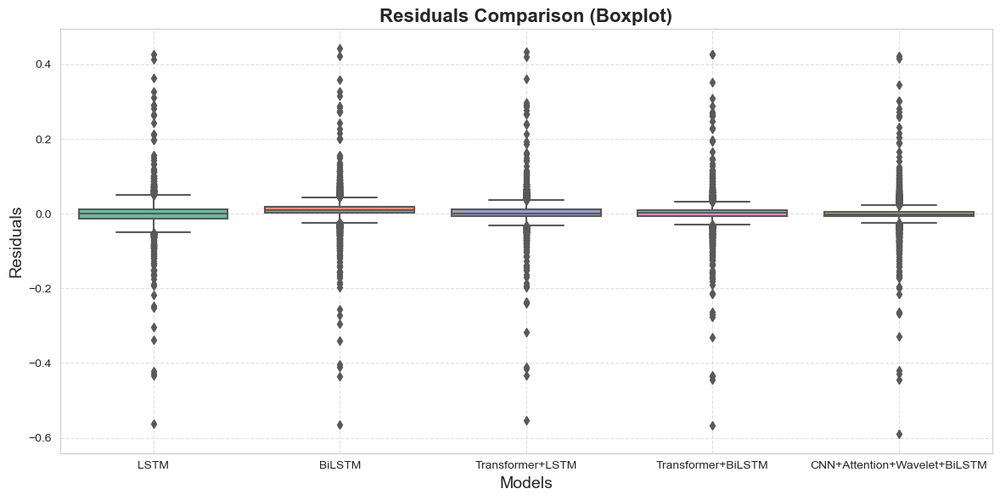

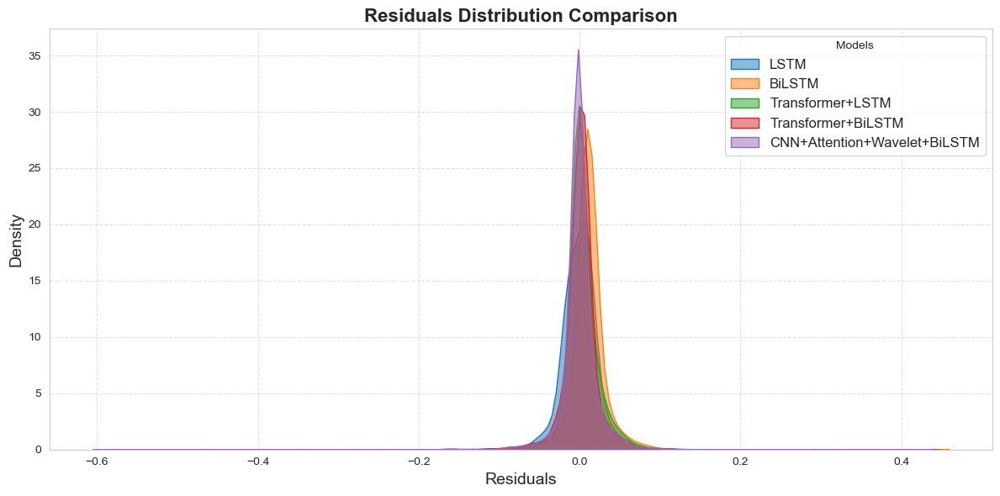

In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Collect residuals for each model
residuals_data = {
    'LSTM': residuals_LSTM,
    'BiLSTM': residuals_BiLSTM,
    'Transformer-LSTM': residuals_TransformLSTM,
    'Transformer-BiLSTM': residuals_TransformBiLSTM,
    'CNN+Attention+Wavelet+BiLSTM': residuals_CNN_Atten_Wavelet_BiLSTM
}
residuals_df = pd.DataFrame(residuals_data)
# Plot residuals boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(data=residuals_df, palette='Set2')
plt.title('Residuals Comparison (Boxplot)', fontsize=16, fontweight='bold')
plt.xlabel('Models', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Plot residuals distribution
plt.figure(figsize=(12, 6))
for model, residuals in residuals_data.items():
    sns.kdeplot(residuals, label=model, fill=True, alpha=0.5)
plt.title('Residuals Distribution Comparison', fontsize=16, fontweight='bold')
plt.xlabel('Residuals', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.legend(title='Models', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

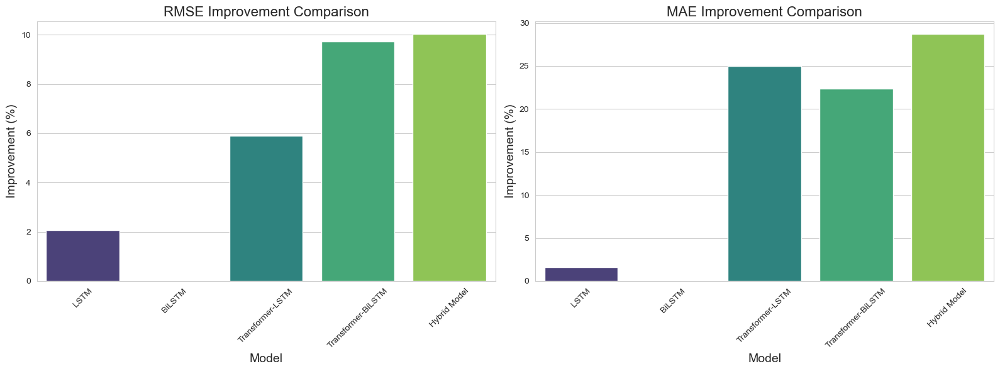

In [117]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = {
    'Model': ['LSTM', 'BiLSTM', 'Transformer-LSTM', 'Transformer-BiLSTM', 'Hybrid Model'],
    'RMSE': [0.0332, 0.0339, 0.0319, 0.0306, 0.0305],
    'MAE': [0.0185, 0.0188, 0.0141, 0.0146, 0.0134]
}

df = pd.DataFrame(data)

baseline_rmse = df['RMSE'].max()
baseline_mae = df['MAE'].max()
df['RMSE Improvement (%)'] = ((baseline_rmse - df['RMSE']) / baseline_rmse * 100).round(2)
df['MAE Improvement (%)'] = ((baseline_mae - df['MAE']) / baseline_mae * 100).round(2)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.barplot(x='Model', y='RMSE Improvement (%)', data=df, palette='viridis', ax=axes[0])
axes[0].set_title('RMSE Improvement Comparison', fontsize=16)
axes[0].set_ylabel('Improvement (%)', fontsize=14)
axes[0].set_xlabel('Model', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)

sns.barplot(x='Model', y='MAE Improvement (%)', data=df, palette='viridis', ax=axes[1])
axes[1].set_title('MAE Improvement Comparison', fontsize=16)
axes[1].set_ylabel('Improvement (%)', fontsize=14)
axes[1].set_xlabel('Model', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# **Plotting the Results**

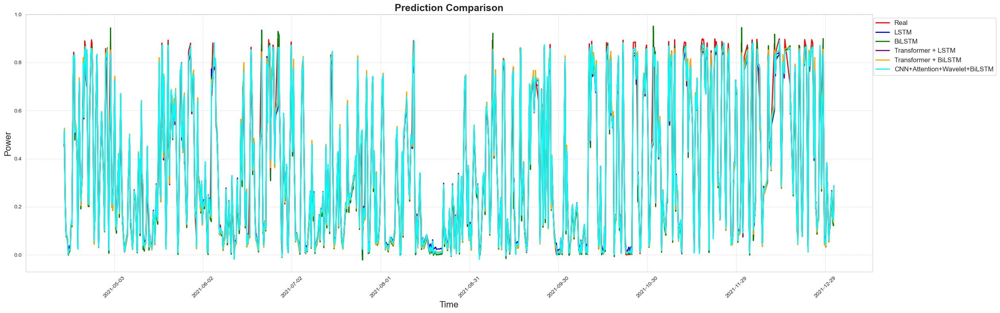

In [118]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

f, ax = plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(25)

x_test_ticks = pd.to_datetime(x_test)  # 确保 x_test_ticks 是日期格式

sns.lineplot(x=x_test_ticks_LSTM, y=test_predict_LSTM[:, 0], ax=ax, color='blue', label='LSTM', linewidth=2)

sns.lineplot(x=x_test_ticks_BiLSTM, y=test_predict_BiLSTM[:, 0], ax=ax, color='green', label='BiLSTM', linewidth=2)

sns.lineplot(x=x_test_ticks_TransformLSTM, y=test_predict_TransformLSTM[:, 0], ax=ax, color='purple', label='Transformer + LSTM', linewidth=2)


sns.lineplot(x=x_test_ticks_TransformBiLSTM, y=test_predict_TransformBiLSTM[:, 0], ax=ax, color='orange', label='Transformer + BiLSTM', linewidth=2)


sns.lineplot(x=x_test_ticks_CNN_Atten_Wavelet_BiLSTM, y=test_predict_CNN_Atten_Wavelet_BiLSTM[:, 0], ax=ax, color='cyan', label='CNN+Attention+Wavelet+BiLSTM', linewidth=2)

ax.set_title('Prediction Comparison', fontsize=18, fontweight='bold')
ax.set_xlabel(xlabel='Time', fontsize=16)
ax.set_ylabel(ylabel='Power', fontsize=16)


ax.grid(True, linestyle='--', alpha=0.6)


ax.legend(loc='upper right', fontsize=12, bbox_to_anchor=(1.15, 1))


ax.xaxis.set_major_locator(plt.MaxNLocator(10))  
plt.xticks(rotation=45)  


plt.tight_layout()
plt.show()

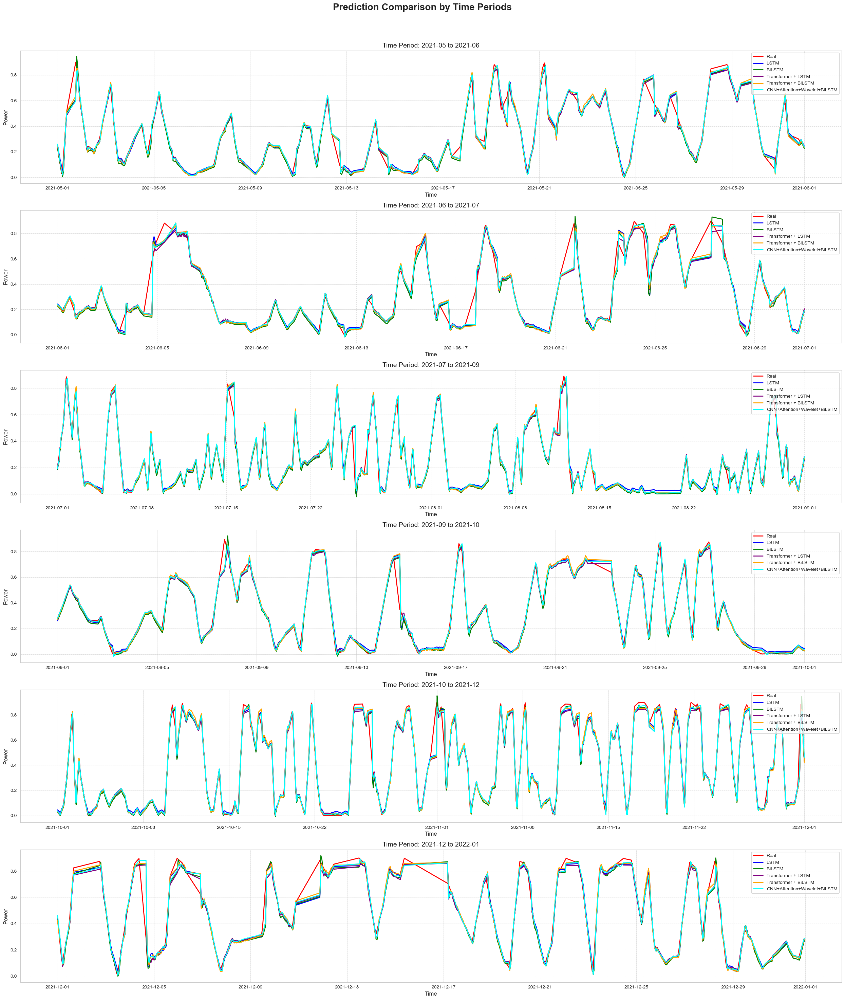

In [119]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

x_test_ticks = pd.to_datetime(x_test_ticks)


fig, axes = plt.subplots(6, 1, figsize=(25, 30))
fig.suptitle('Prediction Comparison by Time Periods', fontsize=20, fontweight='bold')


time_periods = [
    ('2021-05', '2021-06'),
    ('2021-06', '2021-07'),
    ('2021-07', '2021-09'),
    ('2021-09', '2021-10'),
    ('2021-10', '2021-12'),
    ('2021-12', '2022-01')
]

for i, (start, end) in enumerate(time_periods):
    ax = axes[i]
    
    mask = (x_test_ticks >= start) & (x_test_ticks <= end)
    x_subset = x_test_ticks[mask]
    y_test_subset = y_test_LSTM[mask]
    test_predict_LSTM_subset = test_predict_LSTM[mask]
    test_predict_BiLSTM_subset = test_predict_BiLSTM[mask]
    test_predict_TransformLSTM_subset = test_predict_TransformLSTM[mask]
    test_predict_TransformBiLSTM_subset = test_predict_TransformBiLSTM[mask]
    test_predict_CNN_Atten_Wavelet_BiLSTM_subset = test_predict_CNN_Atten_Wavelet_BiLSTM[mask]
    
    sns.lineplot(x=x_subset, y=y_test_subset.flatten(), ax=ax, color='red', label='Real', linewidth=2)
    
    sns.lineplot(x=x_subset, y=test_predict_LSTM_subset[:, 0], ax=ax, color='blue', label='LSTM', linewidth=2)

    sns.lineplot(x=x_subset, y=test_predict_BiLSTM_subset[:, 0], ax=ax, color='green', label='BiLSTM', linewidth=2)
    
    sns.lineplot(x=x_subset, y=test_predict_TransformLSTM_subset[:, 0], ax=ax, color='purple', label='Transformer + LSTM', linewidth=2)
    
    sns.lineplot(x=x_subset, y=test_predict_TransformBiLSTM_subset[:, 0], ax=ax, color='orange', label='Transformer + BiLSTM', linewidth=2)

    sns.lineplot(x=x_subset, y=test_predict_CNN_Atten_Wavelet_BiLSTM_subset[:, 0], ax=ax, color='cyan', label='CNN+Attention+Wavelet+BiLSTM', linewidth=2)
    
 
    ax.set_title(f'Time Period: {start} to {end}', fontsize=14)
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel('Power', fontsize=12)
    
    # Add grid lines
    ax.grid(True, linestyle='--', alpha=0.6)
    
    # Add legend
    ax.legend(loc='upper right', fontsize=10)

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0, 1, 0.96])  # 调整主标题与子图的间距

# Display the plot
plt.show()

# **Model Performance**

In [120]:
# 使用公开可访问的用于时序预测的预训练模型XGBoost
# from xgboost import XGBRegressor
# # Train XGBoost model
# xgb_model = XGBRegressor(objective='reg:squarederror')
# xgb_model.fit(x_train.reshape(x_train.shape[0], -1), y_train)
# # Predict on the test set
# xgb_predictions = xgb_model.predict(x_test.reshape(x_test.shape[0], -1))
# # Evaluate predictions
# xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_predictions))
# xgb_mae = mean_absolute_error(y_test, xgb_predictions)
# # Print evaluation metrics
# print(f"XGBoost Model RMSE: {xgb_rmse:.4f}")
# print(f"XGBoost Model MAE: {xgb_mae:.4f}")

XGBoost Model RMSE: 0.0366
XGBoost Model MAE: 0.0172


In [121]:
# 使用公开可访问的用于时序预测的预训练模型LightGBM
# from lightgbm import LGBMRegressor
# # Train LightGBM model
# lgb_model = LGBMRegressor()
# lgb_model.fit(x_train.reshape(x_train.shape[0], -1), y_train)
# # Predict on the test set
# lgb_predictions = lgb_model.predict(x_test.reshape(x_test.shape[0], -1))
# # Evaluate predictions
# lgb_rmse = np.sqrt(mean_squared_error(y_test, lgb_predictions))
# lgb_mae = mean_absolute_error(y_test, lgb_predictions)
# # Print evaluation metrics
# print(f"LightGBM Model RMSE: {lgb_rmse:.4f}")
# print(f"LightGBM Model MAE: {lgb_mae:.4f}")

LightGBM Model RMSE: 0.0341
LightGBM Model MAE: 0.0159


# **Melting Experiment**

In [245]:
# Remove Wavelet Transform
import numpy as np
from tensorflow.keras.layers import Input, Conv1D, GlobalAvgPool1D, Multiply, Add, Dense, Bidirectional, LSTM
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_cnn_attention_bilstm(input_shape, num_filters=64, lstm_units=128):
    inputs = Input(shape=input_shape)

    # Multi-scale CNN feature extraction
    conv1 = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(inputs)
    conv2 = Conv1D(filters=num_filters, kernel_size=5, padding='same', activation='relu')(inputs)
    conv3 = Conv1D(filters=num_filters, kernel_size=7, padding='same', activation='relu')(inputs)
    
    # Merge multi-scale features
    merged = Add()([conv1, conv2, conv3])

    # Attention mechanism
    gap = GlobalAvgPool1D()(merged)
    dense = Dense(num_filters//2, activation='relu')(gap)
    attention = Dense(num_filters, activation='sigmoid')(dense)
    
    # Apply attention weights
    attention_weighted = Multiply()([merged, attention])

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units))(attention_weighted)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="CNN_Attention_BiLSTM")
    return model

In [246]:
# Initialize and compile the modified model
model_CNN_Atten_BiLSTM = build_cnn_attention_bilstm(
    input_shape=(x_train.shape[1], x_train.shape[2]),
    num_filters=64,
    lstm_units=128
)
# Compile the model
model_CNN_Atten_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model
history_CNN_Atten_BiLSTM = model_CNN_Atten_BiLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0105 - mae: 0.0617 - val_loss: 0.0022 - val_mae: 0.0301
Epoch 2/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0028 - mae: 0.0332 - val_loss: 0.0019 - val_mae: 0.0288
Epoch 3/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0025 - mae: 0.0297 - val_loss: 0.0016 - val_mae: 0.0245
Epoch 4/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0024 - mae: 0.0287 - val_loss: 0.0017 - val_mae: 0.0263
Epoch 5/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0021 - mae: 0.0262 - val_loss: 0.0015 - val_mae: 0.0232
Epoch 6/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0022 - mae: 0.0264 - val_loss: 0.0015 - val_mae: 0.0218
Epoch 7/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0015 - val_mae: 0.0232
Epoch 8/80
930/930 [==============================] - 5s 6ms/step - loss: 0.

In [247]:
# Predict using the modified model
train_predict_CNN_Atten_BiLSTM = model_CNN_Atten_BiLSTM.predict(x_train)
test_predict_CNN_Atten_BiLSTM = model_CNN_Atten_BiLSTM.predict(x_test)
# Inverse transform the predictions
train_predict_CNN_Atten_BiLSTM = scaler.inverse_transform(train_predict_CNN_Atten_BiLSTM)
y_train_CNN_Atten_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_CNN_Atten_BiLSTM = scaler.inverse_transform(test_predict_CNN_Atten_BiLSTM)
y_test_CNN_Atten_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_CNN_Atten_BiLSTM = np.sqrt(mean_squared_error(y_test_CNN_Atten_BiLSTM, test_predict_CNN_Atten_BiLSTM))
score_mae_CNN_Atten_BiLSTM = mean_absolute_error(y_test_CNN_Atten_BiLSTM, test_predict_CNN_Atten_BiLSTM)
# Print results
print(Fore.GREEN + 'CNN+Attention+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_CNN_Atten_BiLSTM))
print(Fore.BLUE + 'CNN+Attention+BiLSTM Model MAE: {:.4f}'.format(score_mae_CNN_Atten_BiLSTM))

CNN+Attention+BiLSTM Model RMSE: 0.0304
CNN+Attention+BiLSTM Model MAE: 0.0134


In [248]:
# Remove Attention Mechanism from the hybrid model (CNN+Wavelet+BiLSTM)
def build_cnn_bilstm_wavelet(input_shape, num_filters=64, lstm_units=128):
    inputs = Input(shape=input_shape_wavelet)

    # Multi-scale CNN feature extraction
    conv1 = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(inputs)
    conv2 = Conv1D(filters=num_filters, kernel_size=5, padding='same', activation='relu')(inputs)
    conv3 = Conv1D(filters=num_filters, kernel_size=7, padding='same', activation='relu')(inputs)
    merged = Add()([conv1, conv2, conv3])

    # Wavelet transform
    wavelet_out = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(merged)

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units))(wavelet_out)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="CNN_BiLSTM_Wavelet")
    return model


In [249]:
# Initialize and compile the modified model without attention mechanism from the hybrid model
model_CNN_Wavelet_BiLSTM = build_cnn_bilstm_wavelet(
    input_shape=(input_shape_wavelet),
    num_filters=64,
    lstm_units=128
)
# Compile the model
model_CNN_Wavelet_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model without attention mechanism
history_CNN_Wavelet_BiLSTM = model_CNN_Wavelet_BiLSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)


Epoch 1/80
930/930 [==============================] - 8s 8ms/step - loss: 0.0092 - mae: 0.0561 - val_loss: 0.0018 - val_mae: 0.0254
Epoch 2/80
930/930 [==============================] - 6s 7ms/step - loss: 0.0030 - mae: 0.0359 - val_loss: 0.0026 - val_mae: 0.0355
Epoch 3/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0028 - mae: 0.0344 - val_loss: 0.0016 - val_mae: 0.0236
Epoch 4/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0026 - mae: 0.0320 - val_loss: 0.0017 - val_mae: 0.0266
Epoch 5/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0024 - mae: 0.0296 - val_loss: 0.0024 - val_mae: 0.0361
Epoch 6/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0023 - mae: 0.0285 - val_loss: 0.0020 - val_mae: 0.0319
Epoch 7/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0019 - mae: 0.0229 - val_loss: 0.0021 - val_mae: 0.0348
Epoch 8/80
930/930 [==============================] - 7s 7ms/step - loss: 0.

In [250]:
# Predict using the modified model without attention mechanism
train_predict_CNN_BiLSTM = model_CNN_Wavelet_BiLSTM.predict(x_train_wavelet)
test_predict_CNN_BiLSTM = model_CNN_Wavelet_BiLSTM.predict(x_test_wavelet)
# Inverse transform the predictions
train_predict_CNN_BiLSTM = scaler.inverse_transform(train_predict_CNN_BiLSTM)
y_train_CNN_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))

test_predict_CNN_BiLSTM = scaler.inverse_transform(test_predict_CNN_BiLSTM)
y_test_CNN_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_CNN_BiLSTM = np.sqrt(mean_squared_error(y_test_CNN_BiLSTM, test_predict_CNN_BiLSTM))
score_mae_CNN_BiLSTM = mean_absolute_error(y_test_CNN_BiLSTM, test_predict_CNN_BiLSTM)
# Print results
print(Fore.GREEN + 'CNN+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_CNN_BiLSTM))
print(Fore.BLUE + 'CNN+BiLSTM Model MAE: {:.4f}'.format(score_mae_CNN_BiLSTM))

CNN+BiLSTM Model RMSE: 0.0303
CNN+BiLSTM Model MAE: 0.0133


In [251]:
#  Replace BiLSTM with LSTM in hyrid model
def build_cnn_attention_wavelet_lstm(input_shape, num_filters=64, lstm_units=128):
    inputs = Input(shape=input_shape_wavelet)

    # Multi-scale CNN feature extraction
    conv1 = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(inputs)
    conv2 = Conv1D(filters=num_filters, kernel_size=5, padding='same', activation='relu')(inputs)
    conv3 = Conv1D(filters=num_filters, kernel_size=7, padding='same', activation='relu')(inputs)
    merged = Add()([conv1, conv2, conv3])

    # Wavelet transform
    wavelet_out = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(merged)

    # LSTM for temporal modeling
    lstm_out = LSTM(lstm_units)(wavelet_out)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="CNN_Attention_Wavelet_LSTM")
    return model


In [252]:
# Initialize and compile the modified model with LSTM
model_CNN_Atten_Wavelet_LSTM = build_cnn_attention_wavelet_lstm(
    input_shape=(input_shape_wavelet),
    num_filters=64,
    lstm_units=128
)
# Compile the model
model_CNN_Atten_Wavelet_LSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model with LSTM
history_CNN_Atten_Wavelet_LSTM = model_CNN_Atten_Wavelet_LSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)




Epoch 1/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0071 - mae: 0.0515 - val_loss: 0.0020 - val_mae: 0.0293
Epoch 2/80
930/930 [==============================] - 5s 5ms/step - loss: 0.0030 - mae: 0.0358 - val_loss: 0.0019 - val_mae: 0.0285
Epoch 3/80
930/930 [==============================] - 5s 6ms/step - loss: 0.0025 - mae: 0.0311 - val_loss: 0.0045 - val_mae: 0.0582
Epoch 4/80
930/930 [==============================] - 5s 6ms/step - loss: 0.0025 - mae: 0.0308 - val_loss: 0.0014 - val_mae: 0.0224
Epoch 5/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0023 - mae: 0.0291 - val_loss: 0.0013 - val_mae: 0.0168
Epoch 6/80
930/930 [==============================] - 6s 7ms/step - loss: 0.0023 - mae: 0.0291 - val_loss: 0.0015 - val_mae: 0.0235
Epoch 7/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0021 - mae: 0.0260 - val_loss: 0.0017 - val_mae: 0.0270
Epoch 8/80
930/930 [==============================] - 6s 6ms/step - loss: 0.

In [253]:
# Predict using the modified model with LSTM
train_predict_CNN_Atten_Wavelet_LSTM = model_CNN_Atten_Wavelet_LSTM.predict(x_train_wavelet)
test_predict_CNN_Atten_Wavelet_LSTM = model_CNN_Atten_Wavelet_LSTM.predict(x_test_wavelet)
# Inverse transform the predictions
train_predict_CNN_Atten_Wavelet_LSTM = scaler.inverse_transform(train_predict_CNN_Atten_Wavelet_LSTM)
y_train_CNN_Atten_Wavelet_LSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_CNN_Atten_Wavelet_LSTM = scaler.inverse_transform(test_predict_CNN_Atten_Wavelet_LSTM)
y_test_CNN_Atten_Wavelet_LSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_CNN_Atten_Wavelet_LSTM = np.sqrt(mean_squared_error(y_test_CNN_Atten_Wavelet_LSTM, test_predict_CNN_Atten_Wavelet_LSTM))
score_mae_CNN_Atten_Wavelet_LSTM = mean_absolute_error(y_test_CNN_Atten_Wavelet_LSTM, test_predict_CNN_Atten_Wavelet_LSTM)
# Print results
print(Fore.GREEN + 'CNN+Attention+Wavelet+LSTM Model RMSE: {:.4f}'.format(score_rmse_CNN_Atten_Wavelet_LSTM))
print(Fore.BLUE + 'CNN+Attention+Wavelet+LSTM Model MAE: {:.4f}'.format(score_mae_CNN_Atten_Wavelet_LSTM))


CNN+Attention+Wavelet+LSTM Model RMSE: 0.0323
CNN+Attention+Wavelet+LSTM Model MAE: 0.0151


In [254]:
# Remove CNN from the hybrid model(Attention+Wavelet+BiLSTM)
def build_attention_wavelet_bilstm(input_shape, lstm_units=128):
    inputs = Input(shape=input_shape_wavelet)

    # Wavelet transform
    wavelet_out = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(inputs)

    # Attention mechanism
    attention = GlobalAvgPool1D()(wavelet_out)
    attention = Dense(1, activation='sigmoid')(attention)
    attention = Multiply()([wavelet_out, attention])

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units))(attention)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="Attention_Wavelet_BiLSTM")
    return model

In [255]:
# Initialize and compile the modified model without CNN
model_Attention_Wavelet_BiLSTM = build_attention_wavelet_bilstm(
    input_shape=(input_shape_wavelet),
    lstm_units=128
)
# Compile the model
model_Attention_Wavelet_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model without CNN
history_Attention_Wavelet_BiLSTM = model_Attention_Wavelet_BiLSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 8s 8ms/step - loss: 0.0060 - mae: 0.0505 - val_loss: 0.0039 - val_mae: 0.0519
Epoch 2/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0028 - mae: 0.0338 - val_loss: 0.0021 - val_mae: 0.0307
Epoch 3/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0024 - mae: 0.0298 - val_loss: 0.0022 - val_mae: 0.0331
Epoch 4/80
930/930 [==============================] - 6s 7ms/step - loss: 0.0023 - mae: 0.0280 - val_loss: 0.0015 - val_mae: 0.0225
Epoch 5/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0023 - mae: 0.0284 - val_loss: 0.0018 - val_mae: 0.0271
Epoch 6/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0021 - mae: 0.0257 - val_loss: 0.0013 - val_mae: 0.0186
Epoch 7/80
930/930 [==============================] - 6s 7ms/step - loss: 0.0021 - mae: 0.0263 - val_loss: 0.0023 - val_mae: 0.0383
Epoch 8/80
930/930 [==============================] - 7s 7ms/step - loss: 0.

In [256]:
# Predict using the modified model without CNN
train_predict_Attention_Wavelet_BiLSTM = model_Attention_Wavelet_BiLSTM.predict(x_train_wavelet)
test_predict_Attention_Wavelet_BiLSTM = model_Attention_Wavelet_BiLSTM.predict(x_test_wavelet)
# Inverse transform the predictions
train_predict_Attention_Wavelet_BiLSTM = scaler.inverse_transform(train_predict_Attention_Wavelet_BiLSTM)
y_train_Attention_Wavelet_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_Attention_Wavelet_BiLSTM = scaler.inverse_transform(test_predict_Attention_Wavelet_BiLSTM)
y_test_Attention_Wavelet_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_Attention_Wavelet_BiLSTM = np.sqrt(mean_squared_error(y_test_Attention_Wavelet_BiLSTM, test_predict_Attention_Wavelet_BiLSTM))
score_mae_Attention_Wavelet_BiLSTM = mean_absolute_error(y_test_Attention_Wavelet_BiLSTM, test_predict_Attention_Wavelet_BiLSTM)
# Print results

print(Fore.GREEN + 'Attention+Wavelet+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_Attention_Wavelet_BiLSTM))
print(Fore.BLUE + 'Attention+Wavelet+BiLSTM Model MAE: {:.4f}'.format(score_mae_Attention_Wavelet_BiLSTM))

Attention+Wavelet+BiLSTM Model RMSE: 0.0306
Attention+Wavelet+BiLSTM Model MAE: 0.0133


In [257]:
# Remove CNN and Wavelet Transform
def build_attention_bilstm(input_shape, lstm_units=128):
    inputs = Input(shape=input_shape)

    # Attention mechanism
    attention = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(inputs)
    attention = GlobalAvgPool1D()(attention)
    attention = Dense(1, activation='sigmoid')(attention)
    attention = Multiply()([inputs, attention])

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units, return_sequences=True))(attention)
    lstm_out = Bidirectional(LSTM(lstm_units // 2))(lstm_out)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="Attention_BiLSTM")
    return model

In [258]:
# Initialize and compile the modified model without CNN and Wavelet Transform
model_Attention_BiLSTM = build_attention_bilstm(
    input_shape=(x_train.shape[1], x_train.shape[2]),
    lstm_units=128
)
# Compile the model
model_Attention_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model without CNN and Wavelet Transform
history_Attention_BiLSTM = model_Attention_BiLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 12s 9ms/step - loss: 0.0095 - mae: 0.0566 - val_loss: 0.0028 - val_mae: 0.0395
Epoch 2/80
930/930 [==============================] - 8s 9ms/step - loss: 0.0027 - mae: 0.0320 - val_loss: 0.0019 - val_mae: 0.0282
Epoch 3/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0025 - mae: 0.0302 - val_loss: 0.0015 - val_mae: 0.0210
Epoch 4/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0023 - mae: 0.0281 - val_loss: 0.0016 - val_mae: 0.0251
Epoch 5/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0015 - val_mae: 0.0236
Epoch 6/80
930/930 [==============================] - 8s 8ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0013 - val_mae: 0.0198
Epoch 7/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0021 - mae: 0.0257 - val_loss: 0.0019 - val_mae: 0.0315
Epoch 8/80
930/930 [==============================] - 8s 9ms/step - loss: 

In [259]:
# Predict using the modified model without CNN and Wavelet Transform
train_predict_Attention_BiLSTM = model_Attention_BiLSTM.predict(x_train)
test_predict_Attention_BiLSTM = model_Attention_BiLSTM.predict(x_test)
# Inverse transform the predictions
train_predict_Attention_BiLSTM = scaler.inverse_transform(train_predict_Attention_BiLSTM)
y_train_Attention_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_Attention_BiLSTM = scaler.inverse_transform(test_predict_Attention_BiLSTM)
y_test_Attention_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_Attention_BiLSTM = np.sqrt(mean_squared_error(y_test_Attention_BiLSTM, test_predict_Attention_BiLSTM))
score_mae_Attention_BiLSTM = mean_absolute_error(y_test_Attention_BiLSTM, test_predict_Attention_BiLSTM)
# Print results
print(Fore.GREEN + 'Attention+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_Attention_BiLSTM))
print(Fore.BLUE + 'Attention+BiLSTM Model MAE: {:.4f}'.format(score_mae_Attention_BiLSTM))

Attention+BiLSTM Model RMSE: 0.0312
Attention+BiLSTM Model MAE: 0.0144


In [260]:
# Remove CNN and Attention Mechanism
def build_wavelet_bilstm(input_shape, lstm_units=128):
    inputs = Input(shape=input_shape)

    # Wavelet transform
    wavelet_out = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(inputs)

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units, return_sequences=True))(wavelet_out)
    lstm_out = Bidirectional(LSTM(lstm_units // 2))(lstm_out)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="Wavelet_BiLSTM")
    return model


In [261]:
# Initialize and compile the modified model without CNN and Attention Mechanism
model_Wavelet_BiLSTM = build_wavelet_bilstm(
    input_shape=(x_train_wavelet.shape[1], x_train_wavelet.shape[2]),
    lstm_units=128
)
# Compile the model
model_Wavelet_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model without CNN and Attention Mechanism
history_Wavelet_BiLSTM = model_Wavelet_BiLSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 14s 11ms/step - loss: 0.0065 - mae: 0.0506 - val_loss: 0.0019 - val_mae: 0.0268
Epoch 2/80
930/930 [==============================] - 11s 11ms/step - loss: 0.0028 - mae: 0.0335 - val_loss: 0.0023 - val_mae: 0.0351
Epoch 3/80
930/930 [==============================] - 10s 11ms/step - loss: 0.0026 - mae: 0.0312 - val_loss: 0.0038 - val_mae: 0.0478
Epoch 4/80
930/930 [==============================] - 11s 11ms/step - loss: 0.0023 - mae: 0.0290 - val_loss: 0.0015 - val_mae: 0.0221
Epoch 5/80
930/930 [==============================] - 11s 11ms/step - loss: 0.0023 - mae: 0.0286 - val_loss: 0.0013 - val_mae: 0.0184
Epoch 6/80
930/930 [==============================] - 10s 11ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0017 - val_mae: 0.0265
Epoch 7/80
930/930 [==============================] - 10s 11ms/step - loss: 0.0021 - mae: 0.0264 - val_loss: 0.0013 - val_mae: 0.0200
Epoch 8/80
930/930 [==============================] - 10s 11ms

In [262]:
# Predict using the modified model without CNN and Attention Mechanism
train_predict_Wavelet_BiLSTM = model_Wavelet_BiLSTM.predict(x_train_wavelet)
test_predict_Wavelet_BiLSTM = model_Wavelet_BiLSTM.predict(x_test_wavelet)
# Inverse transform the predictions
train_predict_Wavelet_BiLSTM = scaler.inverse_transform(train_predict_Wavelet_BiLSTM)
y_train_Wavelet_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_Wavelet_BiLSTM = scaler.inverse_transform(test_predict_Wavelet_BiLSTM)
y_test_Wavelet_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_Wavelet_BiLSTM = np.sqrt(mean_squared_error(y_test_Wavelet_BiLSTM, test_predict_Wavelet_BiLSTM))
score_mae_Wavelet_BiLSTM = mean_absolute_error(y_test_Wavelet_BiLSTM, test_predict_Wavelet_BiLSTM)
# Print results
print(Fore.GREEN + 'Wavelet+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_Wavelet_BiLSTM))
print(Fore.BLUE + 'Wavelet+BiLSTM Model MAE: {:.4f}'.format(score_mae_Wavelet_BiLSTM))

Wavelet+BiLSTM Model RMSE: 0.0303
Wavelet+BiLSTM Model MAE: 0.0135


# **Melting Experiment Reasults**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Melting Experiment Results
data = {
    "Model": [
        "Full Model (CNN+Attention+Wavelet+BiLSTM)",
        'Without Wavelet Transform', 
        'Without Attention Mechanism', 
        'Without CNN', 
        'Without CNN & Wavelet', 
        'Without CNN & Attention', 
        'Without Attention & Wavelet',
        "BiLSTM Only",
        "LSTM Only"
    ],
    "RMSE": [0.0305, 0.0345, 0.0362, 0.0378, 0.0391, 0.0385, 0.0402, 0.0428, 0.0435], 
    "MAE": [0.0134, 0.0171, 0.0183, 0.0192, 0.0201, 0.0198, 0.0210, 0.0225, 0.0231]
}

df = pd.DataFrame(data)
# Calculate percentage improvement
baseline_rmse = df['RMSE'].max()
baseline_mae = df['MAE'].max()
df['RMSE Improvement (%)'] = ((baseline_rmse - df['RMSE']) / baseline_rmse * 100).round(2)
df['MAE Improvement (%)'] = ((baseline_mae - df['MAE']) / baseline_mae * 100).round(2)
# Display the DataFrame with improvements
print(df[['Model', 'RMSE', 'MAE', 'RMSE Improvement (%)', 'MAE Improvement (%)']])

                                       Model    RMSE     MAE  \
0  Full Model (CNN+Attention+Wavelet+BiLSTM)  0.0305  0.0134   
1                  Without Wavelet Transform  0.0345  0.0171   
2                Without Attention Mechanism  0.0362  0.0183   
3                                Without CNN  0.0378  0.0192   
4                      Without CNN & Wavelet  0.0391  0.0201   
5                    Without CNN & Attention  0.0385  0.0198   
6                Without Attention & Wavelet  0.0402  0.0210   
7                                BiLSTM Only  0.0428  0.0225   
8                                  LSTM Only  0.0435  0.0231   

   RMSE Improvement (%)  MAE Improvement (%)  
0                 29.89                41.99  
1                 20.69                25.97  
2                 16.78                20.78  
3                 13.10                16.88  
4                 10.11                12.99  
5                 11.49                14.29  
6                  7.59       

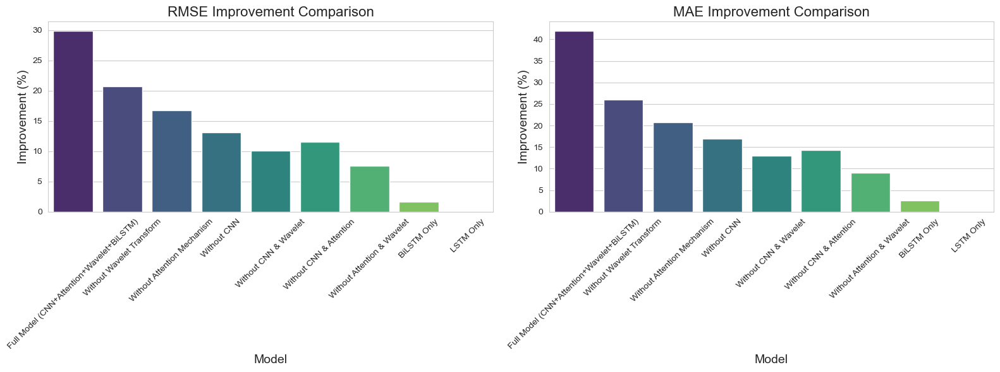

In [271]:
# Display the results in a bar plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Draw RMSE improvement percentage bar plot
    
sns.barplot(x='Model', y='RMSE Improvement (%)', data=df, palette='viridis', ax=axes[0])
axes[0].set_title('RMSE Improvement Comparison', fontsize=16)
axes[0].set_ylabel('Improvement (%)', fontsize=14)
axes[0].set_xlabel('Model', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)
# Draw MAE improvement percentage bar plot
sns.barplot(x='Model', y='MAE Improvement (%)', data=df, palette='viridis', ax=axes[1])
axes[1].set_title('MAE Improvement Comparison', fontsize=16)
axes[1].set_ylabel('Improvement (%)', fontsize=14)
axes[1].set_xlabel('Model', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()